In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('Employee_Compensation.csv')
df.head()

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
0,3,1400,1404,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,790.0,"SEIU, Local 1021, Misc",...,37486688,60720.01,0.00,0.00,60720.01,13653.20,14733.76,4904.34,33291.30,94011.31
1,3,9700,9703,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,39646203,91677.00,0.00,0.00,91677.00,17524.20,14733.76,7411.13,39669.09,131346.09
2,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37486043,89106.03,0.00,1540.00,90646.03,17327.20,14733.76,7401.92,39462.88,130108.91
3,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37615772,85581.11,3355.94,337.75,89274.80,16359.16,14151.56,7096.21,37606.93,126881.73
4,3,2900,2905,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37500212,86457.00,0.00,2090.00,88547.00,16925.97,14733.76,7257.89,38917.62,127464.62


In [3]:
df.columns

Index(['Organization Group Code', 'Job Family Code', 'Job Code', 'Year Type',
       'Year', 'Organization Group', 'Department Code', 'Department',
       'Union Code', 'Union', 'Job Family', 'Job', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation'],
      dtype='object')

In [4]:
df.shape

(840505, 22)

In [5]:
df.describe()

,Organization Group Code,Year,Union Code,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
count,840505.000000,840505.000000,840325.000000,8.405050e+05,840505.000000,840505.000000,840505.000000,840505.000000,840505.000000,840505.000000,840505.000000,840505.000000,840505.000000
mean,2.979749,2017.497922,491.706198,2.535175e+07,74429.744414,6127.984699,3849.333487,84407.062599,15094.393601,10072.050307,5332.573564,30499.017473,114906.080072
std,1.581643,2.835038,330.108797,2.103613e+07,50136.181298,14783.061278,7714.441761,58951.417460,11328.785199,6363.237985,3805.372192,19059.537760,76318.357212
min,1.000000,2013.000000,1.000000,0.000000e+00,-68771.780000,-22453.280000,-19131.100000,-68771.780000,-30621.430000,-3831.090000,-10636.500000,-21295.150000,-74082.610000
25%,2.000000,2015.000000,250.000000,3.572600e+04,34566.300000,0.000000,0.000000,38041.310000,5929.860000,3473.520000,2099.200000,13964.630000,52849.700000
50%,2.000000,2017.000000,535.000000,3.708433e+07,72684.910000,0.000000,792.670000,80157.910000,15097.380000,12529.150000,5223.250000,33848.330000,114280.820000
75%,4.000000,2020.000000,790.000000,4.244406e+07,107052.830000,4936.380000,4577.730000,119825.300000,21717.960000,14950.300000,7965.690000,42972.760000,163406.140000
max,7.000000,2022.000000,990.000000,5.340687e+07,651936.710000,374502.760000,342802.630000,658867.570000,169486.170000,59405.230000,35691.040000,195219.620000,807625.250000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840505 entries, 0 to 840504
Data columns (total 22 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Organization Group Code  840505 non-null  int64  
 1   Job Family Code          840505 non-null  object 
 2   Job Code                 840505 non-null  object 
 3   Year Type                840505 non-null  object 
 4   Year                     840505 non-null  int64  
 5   Organization Group       840505 non-null  object 
 6   Department Code          840503 non-null  object 
 7   Department               840503 non-null  object 
 8   Union Code               840325 non-null  float64
 9   Union                    840326 non-null  object 
 10  Job Family               840505 non-null  object 
 11  Job                      840500 non-null  object 
 12  Employee Identifier      840505 non-null  int64  
 13  Salaries                 840505 non-null  float64
 14  Over

In [7]:
df.isnull().sum()

Organization Group Code      0
Job Family Code              0
Job Code                     0
Year Type                    0
Year                         0
Organization Group           0
Department Code              2
Department                   2
Union Code                 180
Union                      179
Job Family                   0
Job                          5
Employee Identifier          0
Salaries                     0
Overtime                     0
Other Salaries               0
Total Salary                 0
Retirement                   0
Health and Dental            0
Other Benefits               0
Total Benefits               0
Total Compensation           0
dtype: int64

In [8]:
df[df.duplicated()].shape

(0, 22)

In [9]:
numeric1 = df.select_dtypes(include=['int64','float64'])
category = df.select_dtypes(exclude=['int64','float64'])

In [10]:
def barcount(ax):
    for bar in ax.patches:
        percentage = f'{round(bar.get_height())}'
        x = bar.get_x() + bar.get_width() /2
        y= bar.get_height()
        ax.annotate(percentage,(x,y),va='bottom',ha='center')

# Categorical data analysis


In [11]:
category.columns  # 9 columns

Index(['Job Family Code', 'Job Code', 'Year Type', 'Organization Group',
       'Department Code', 'Department', 'Union', 'Job Family', 'Job'],
      dtype='object')

In [12]:
def cat(col):
    print(f'No. of unique values in {col} is:\n {df[col].unique()}')
    print(f'No. of missing values in {col} is: {df[col].isnull().sum()}')
    print(f'Mode of {col} is: {df[col].mode()}')

## 1. Analysis of Job Family Code

In [13]:
cat('Job Family Code')

No. of unique values in Job Family Code is:
 ['1400' '9700' '2900' '9900' '7300' '1900' '9100' '5200' '8200' '1000'
 '7500' 'Q000' '9200' '0000' '2700' '3500' '1800' '6100' '6300' '7200'
 '0900' '5500' '6200' '5300' '1600' '8100' '4200' '1200' '1300' '1500'
 '2300' '2500' '2200' '2400' '2800' '2600' '7100' '2100' '3400' '1100'
 '7400' '5100' '1700' 'H000' '3300' '5600' '4300' '8300' '8400' '3600'
 '9500' '5400' '8600' '9300' '4100' '3200' '__UNASSIGNED__' 'SCRT' 'SFRA']
No. of missing values in Job Family Code is: 0
Mode of Job Family Code is: 0    2300
Name: Job Family Code, dtype: object


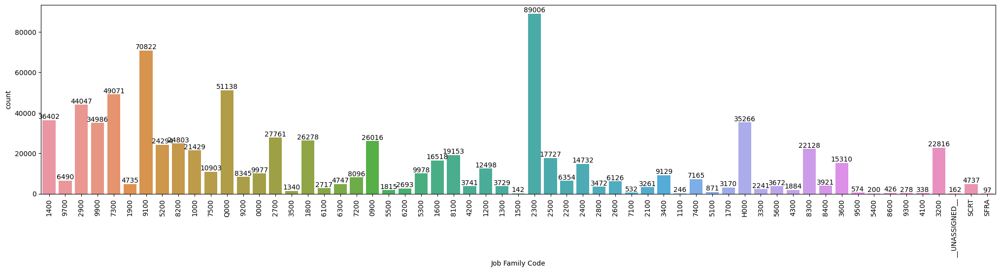

In [14]:
fig,ax = plt.subplots(figsize=(25,5))
sns.countplot(x=df['Job Family Code'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
barcount(ax)

## 2. Analysis of Job code

In [15]:
cat('Job Code')

No. of unique values in Job Code is:
 ['1404' '9703' '2918' ... '2933' '2440' '6266']
No. of missing values in Job Code is: 0
Mode of Job Code is: 0    9163
Name: Job Code, dtype: object


## 3.Analysis of Year Type

In [16]:
cat('Year Type')

No. of unique values in Year Type is:
 ['Fiscal' 'Calendar']
No. of missing values in Year Type is: 0
Mode of Year Type is: 0    Fiscal
Name: Year Type, dtype: object


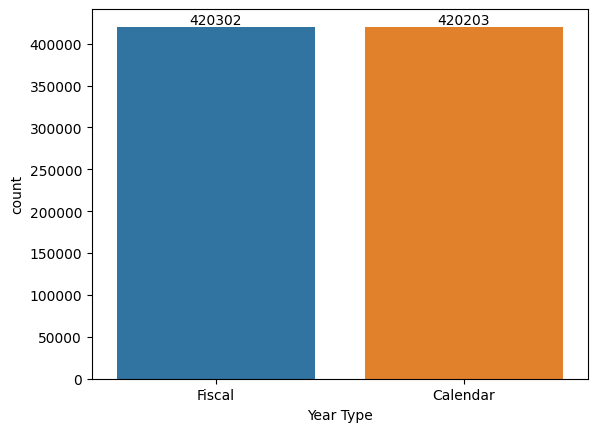

In [17]:
ax = sns.countplot(x=df['Year Type'])
barcount(ax)

## 4.Analsyis of Organization Group

In [18]:
cat('Organization Group')

No. of unique values in Organization Group is:
 ['Human Welfare & Neighborhood Development'
 'Public Works, Transportation & Commerce' 'Public Protection'
 'General Administration & Finance' 'Culture & Recreation'
 'Community Health' 'General City Responsibilities']
No. of missing values in Organization Group is: 0
Mode of Organization Group is: 0    Public Works, Transportation & Commerce
Name: Organization Group, dtype: object


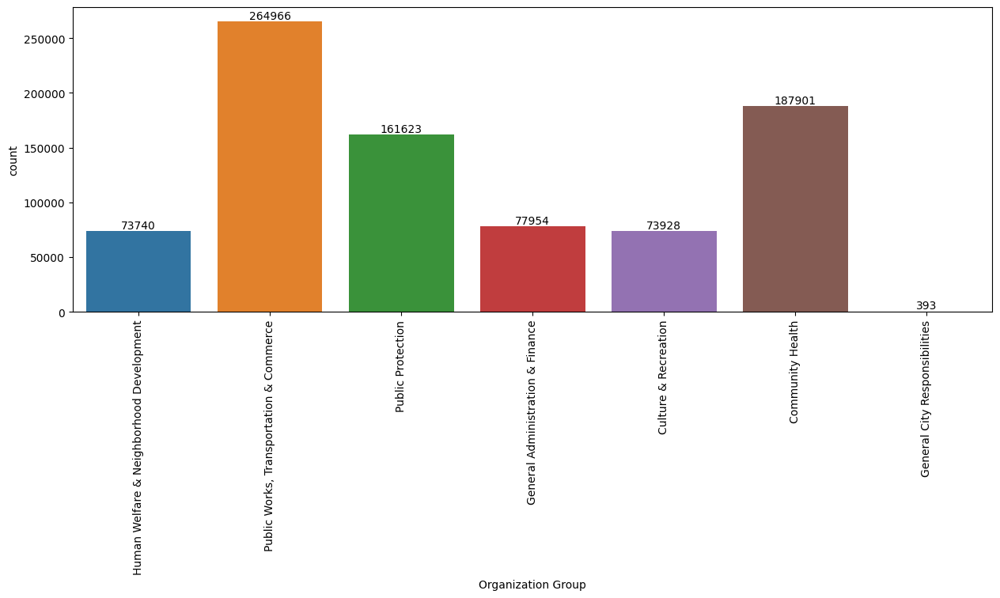

In [19]:
fig,ax = plt.subplots(figsize = (15,5))
ax = sns.countplot(x=df['Organization Group'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
barcount(ax)

## 5.Analysis of  Department Code

In [20]:
cat('Department Code')

No. of unique values in Department Code is:
 ['HSA' 'MTA' 'POL' 'AIR' 'CAT' 'ART' 'ASR' 'BOS' 'CHF' 'CON' 'CPC' 'BOA'
 'CFC' 'CSS' 'DAT' 'CRT' 'DBI' 'CSC' 'DPH' 'DEM' 'DPA' 'DPW' 'ECN' 'FIR'
 'FAM' 'ENV' 'ETH' 'HOM' 'HRD' 'HRC' 'JUV' 'HSS' 'LIB' 'MYR' 'PDR' 'SHF'
 'RET' 'RNT' 'SCI' 'REG' 'ADP' 'TIS' 'PUC' 'AAM' 'ADM' 'PRT' 'REC' 'LLB'
 'TTX' 'WAR' 'WOM' 'PAB' 'DSS' 'ECD' nan 'DEC' 'SDA' 'WTR' 'UNA' 'HHP'
 'CWP' 'CII' 'CLP']
No. of missing values in Department Code is: 2
Mode of Department Code is: 0    DPH
Name: Department Code, dtype: object


In [21]:
df[df['Department Code'].isnull()]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
14105,7,8300,8300,Fiscal,2017,General City Responsibilities,NaN,NaN,790.0,"SEIU, Local 1021, Misc",...,37042591,49630.50,15016.51,3197.52,67844.53,10619.27,12779.88,4796.56,28195.71,96040.24
203580,7,Q000,Q003,Fiscal,2017,General City Responsibilities,NaN,NaN,911.0,POA,...,37069439,116189.62,40990.09,2260.08,159439.79,20076.66,14515.01,2724.05,37315.72,196755.51


In [22]:
len(df)

840505

In [23]:
df.dropna(subset=['Department Code'],inplace = True)

In [24]:
len(df)

840503

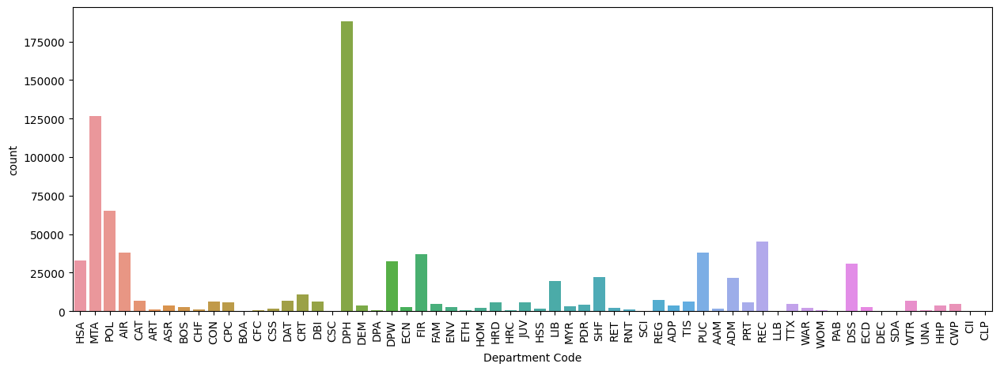

In [25]:
fig,ax = plt.subplots(figsize=(15,5))
ax = sns.countplot(x=df['Department Code'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);
# barcount(ax)

## 6.Analysis of Department

In [26]:
cat('Department')

No. of unique values in Department is:
 ['Human Services' 'Municipal Transportation Agcy' 'Police'
 'Airport Commission' 'City Attorney' 'Art Commission' 'Assessor'
 'Board Of Supervisors' 'Children Youth & Families' 'Controller'
 'City Planning' 'Board Of Appeals' 'Children & Families Commission'
 'Child Support Services' 'District Attorney' 'Trial Courts'
 'Building Inspection' 'Civil Service Commission' 'Public Health'
 'Dept of Emergency Management' 'Dept of Police Accountablility'
 'Department Of Public Works' 'Economic Workforce Development'
 'Fire Department' 'Fine Arts Museum' 'Environment' 'Ethics Commission'
 'Homeless Services' 'Human Resources' 'Human Rights Commission'
 'Juvenile Court' 'Health Service System' 'Public Library' 'Mayor'
 'Public Defender' 'Sheriff' 'Retirement Services'
 'Rent Arbitration Board' 'Academy Of Sciences' 'Registrar'
 'Adult Probation' 'Department of Technology'
 'Public Utilities Commission' 'Asian Art Museum'
 'Administrative Services' 'Port' '

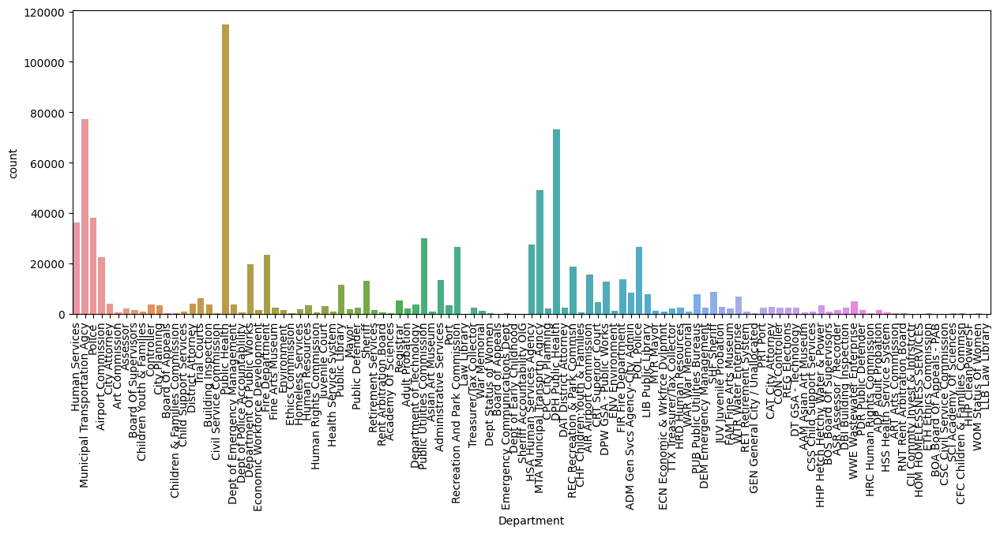

In [27]:
fig,ax = plt.subplots(figsize=(15,5))
ax = sns.countplot(x=df['Department'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


## 7.Analysis of Union

In [28]:
cat('Union')

No. of unique values in Union is:
 ['SEIU, Local 1021, Misc' 'Laborers, Local 261'
 'Stationary Engineers, Local 39' 'TWU, Local 250-A, TransitOpr'
 'Auto Machinist, Local 1414' 'Prof & Tech Eng, Local 21'
 'Electrical Workers, Local 6' 'SF City Workers United' 'POA'
 'Teamsters, Local 853' 'Carpenters, Local 22' 'Plumbers, Local 38'
 'Municipal Exec Assoc, Misc' 'Sheet Metal Workers, Local 104'
 'BrickLayers, Local 3' 'Municipal Attorneys Assoc'
 'Member, Board Or Commission' 'TWU, Local 200' 'Commissioner No Benefits'
 'Utd Pub EmpL790 SEIU-Crt Clrks' 'Court-Unrep Professional'
 'SFDA Investigators Assn' 'Court-Supr Court Interpreters' 'Court-MEA'
 'Court Local 21 Staff Attorneys' 'Building Inspects - 6331/33'
 'Court-Local 21 Professional' 'Court-Court Reporters' 'Court-Judge'
 'SF Courts Commissioner Assoc' 'SEIU, Local 1021, RN'
 'Physician/Dentists 8-CC, UAPD' 'Teamsters, Local 856, Multi'
 'Teamsters, Local 856, Spv RN' 'TWU, Local 250-A, Misc'
 'Physician/Dentists 11-AA, UAPD' 

In [29]:
df[df['Union'].isnull()]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
504957,5,3200,3278,Calendar,2016,Culture & Recreation,REC,REC Recreation & Park Commsn,NaN,NaN,...,106,6077.55,0.00,360.52,6438.07,0.00,2362.44,499.71,2862.15,9300.22
505247,5,3200,3278,Calendar,2016,Culture & Recreation,REC,REC Recreation & Park Commsn,NaN,NaN,...,200,314.21,0.00,9.26,323.47,0.00,122.14,25.11,147.25,470.72
511473,5,3200,3278,Calendar,2016,Culture & Recreation,REC,REC Recreation & Park Commsn,NaN,NaN,...,1609,33.08,0.00,0.00,33.08,0.00,12.85,2.56,15.41,48.49
514040,2,9100,9152,Fiscal,2016,"Public Works, Transportation & Commerce",MTA,MTA Municipal Transprtn Agncy,NaN,NaN,...,2005,17626.21,834.82,1349.21,19810.24,3536.07,2444.13,1561.30,7541.50,27351.74
514045,2,9100,9152,Calendar,2016,"Public Works, Transportation & Commerce",MTA,MTA Municipal Transprtn Agncy,NaN,NaN,...,2005,17626.21,834.82,1349.21,19810.24,3536.07,2520.06,1561.30,7617.43,27427.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
833709,5,3200,3278,Calendar,2016,Culture & Recreation,REC,REC Recreation & Park Commsn,NaN,NaN,...,54478,2174.69,0.00,37.05,2211.74,0.00,845.33,171.66,1016.99,3228.73
838159,2,9100,9152,Calendar,2016,"Public Works, Transportation & Commerce",MTA,MTA Municipal Transprtn Agncy,NaN,NaN,...,53111,21086.40,753.51,1542.23,23382.14,4034.32,3548.47,1855.41,9438.20,32820.34
838868,5,3200,3278,Calendar,2016,Culture & Recreation,REC,REC Recreation & Park Commsn,NaN,NaN,...,53907,3539.05,0.00,269.87,3808.92,0.00,1375.66,295.64,1671.30,5480.22
839463,2,9100,9152,Fiscal,2016,"Public Works, Transportation & Commerce",MTA,MTA Municipal Transprtn Agncy,NaN,NaN,...,53268,26344.00,356.13,1785.17,28485.30,5152.18,4439.12,2263.69,11854.99,40340.29


In [30]:
print(len(df))
df.dropna(subset= ['Union'],inplace=True)
print(len(df))

840503
840324


## 8.Analysis of Job Family

In [31]:
cat('Job Family')

No. of unique values in Job Family is:
 ['Clerical, Secretarial & Steno' 'Community Development' 'Human Services'
 'Public Service Aide' 'Journeyman Trade' 'Purchasing & Storekeeping'
 'Street Transit' 'Professional Engineering' 'Protection & Apprehension'
 'Information Systems' 'Semi-Skilled & General Labor' 'Police Services'
 'Airport Operation' 'Untitled' 'Housekeeping & Laundry'
 'Museum & Cultural Affairs' 'Budget, Admn & Stats Analysis'
 'Health & Sanitation Inspection' 'Construction Inspection'
 'Supervisory-Labor & Trade' 'Management' 'Construction Project Mgmt'
 'Public Safety Inspection' 'Sub-Professional Engineering'
 'Payroll, Billing & Accounting' 'Legal & Court' 'Appraisal & Taxation'
 'Personnel' 'Pub Relations & Spec Assts' 'Administrative Secretarial'
 'Nursing' 'Med Therapy & Auxiliary' 'Medical & Dental'
 'Lab, Pharmacy & Med Techs' 'Public Health' 'Dietary & Food'
 'Administrative-Labor & Trades' 'Hospital Administration'
 'Agriculture & Horticulture' 'Administrativ

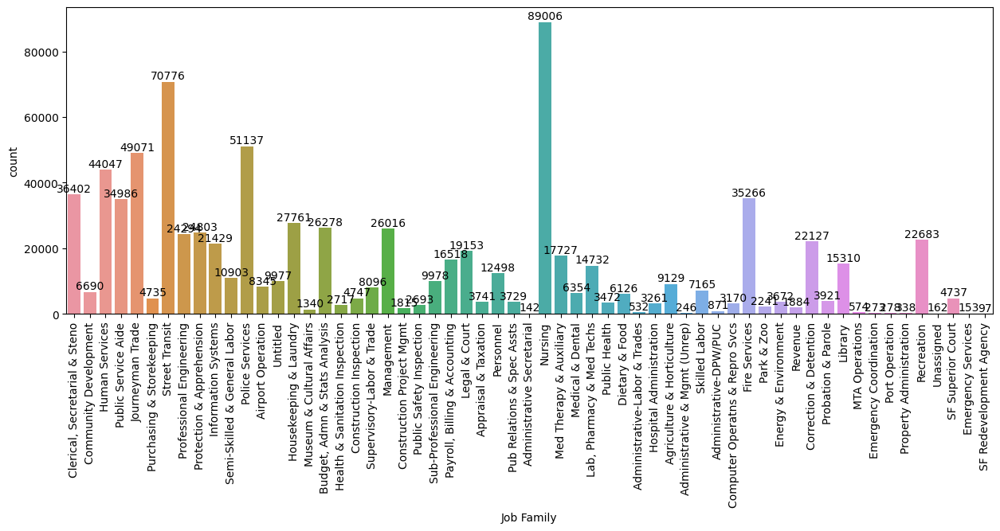

In [32]:
fig,ax = plt.subplots(figsize=(15,5))
ax = sns.countplot(x=df['Job Family'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);
barcount(ax)

## 9.Analysis of Job

In [33]:
cat('Job')

No. of unique values in Job is:
 ['Clerk' 'HSA Emp & Training Spec II' 'HSA Social Worker' ...
 'Vet Laboratory Technologist' 'Senior Plan Checker'
 'Parking Hearing Supervisor']
No. of missing values in Job is: 5
Mode of Job is: 0    Transit Operator
Name: Job, dtype: object


# Numerical Data Analysis

In [34]:
numeric1.columns

Index(['Organization Group Code', 'Year', 'Union Code', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation'],
      dtype='object')

In [35]:
def numeric(col):
    print(f'no. of missing values in {col} is {df[col].isnull().sum()}')
    print(f'mean of {col} is {df[col].mean()}')
    print(f'mode of {col} is {df[col].mode()}')
    print(f'median of {col} is {df[col].median()}')
    print(f'standard deviation of {col} is {df[col].std()}')
    

## 1.Analysis of Organization Group Code

In [36]:
numeric('Organization Group Code')

no. of missing values in Organization Group Code is 0
mean of Organization Group Code is 2.9794733935958035
mode of Organization Group Code is 0    2
Name: Organization Group Code, dtype: int64
median of Organization Group Code is 2.0
standard deviation of Organization Group Code is 1.5815803524752607


In [37]:
df['Organization Group Code'].unique()

array([3, 2, 1, 6, 5, 4, 7], dtype=int64)

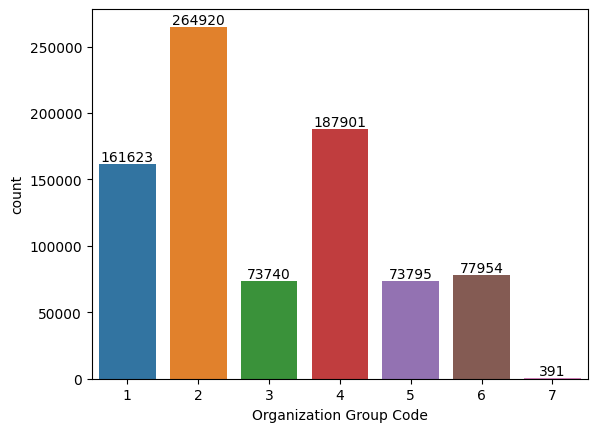

In [38]:
ax = sns.countplot(x=df['Organization Group Code'])
barcount(ax)

## 2. Analysis of Year

In [39]:
numeric('Year')

no. of missing values in Year is 0
mean of Year is 2017.4982423446195
mode of Year is 0    2019
Name: Year, dtype: int64
median of Year is 2017.0
standard deviation of Year is 2.8352584301041586


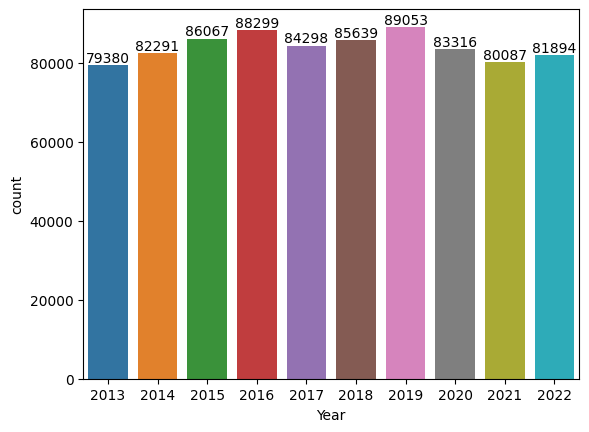

In [40]:
ax = sns.countplot(x = df['Year'])
barcount(ax)

In [41]:
df['Year'].unique()

array([2019, 2018, 2020, 2017, 2021, 2022, 2013, 2016, 2015, 2014],
      dtype=int64)

## 3.Analysis of Union Code

In [42]:
numeric('Union Code')

no. of missing values in Union Code is 1
mean of Union Code is 491.7053442545307
mode of Union Code is 0    790.0
Name: Union Code, dtype: float64
median of Union Code is 535.0
standard deviation of Union Code is 330.1087129146819


In [43]:
df[df['Union Code'].isnull()]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
92441,6,__UNASSIGNED__,9971,Calendar,2022,General Administration & Finance,REG,Registrar,NaN,Unspecified,...,52286956,13227.0,1256.39,3139.62,17623.01,3193.1,2197.92,1395.32,6786.34,24409.35


In [44]:
print(len(df))
df.dropna(subset='Union Code',inplace=True)
print(len(df))

840324
840323


In [45]:
df['Union Code'].nunique()

70

## 4.Analysis of Employee Identifier

In [46]:
numeric('Employee Identifier')

no. of missing values in Employee Identifier is 0
mean of Employee Identifier is 25357086.30400215
mode of Employee Identifier is 0    0
Name: Employee Identifier, dtype: int64
median of Employee Identifier is 37084457.0
standard deviation of Employee Identifier is 21035135.81253495


In [47]:
v = df['Employee Identifier'].value_counts()
v[v>1]

Employee Identifier
0           49
43227       22
7041        21
19638       20
30585       19
            ..
44046281     2
47666464     2
42452725     2
43776155     2
44526094     2
Name: count, Length: 126016, dtype: int64

In [48]:
df['Employee Identifier'].nunique()

470990

## 5. Analysis of Salaries

In [49]:
numeric('Salaries')

no. of missing values in Salaries is 0
mean of Salaries is 74442.96210118016
mode of Salaries is 0    0.0
Name: Salaries, dtype: float64
median of Salaries is 72699.0
standard deviation of Salaries is 50132.8865689381


In [50]:
df[df['Salaries']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
5023,2,1000,1053,Fiscal,2019,"Public Works, Transportation & Commerce",AIR,Airport Commission,21.0,"Prof & Tech Eng, Local 21",...,37206030,-5315.87,0.00,0.00,-5315.87,-992.80,0.00,-418.90,-1411.70,-6727.57
5789,4,2600,2622,Fiscal,2019,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,38476126,-2750.71,83.44,85.55,-2581.72,-622.48,1761.37,-210.72,928.17,-1653.55
23797,1,H000,H003,Fiscal,2021,Public Protection,FIR,Fire Department,798.0,"Firefighters,Local 798, Unit 1",...,43686505,-4833.00,0.00,7492.10,2659.10,-1104.54,5996.35,25.52,4917.33,7576.43
28223,4,2300,2328,Fiscal,2022,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,47226598,-13294.12,-1356.76,6187.44,-8463.44,-3035.63,0.00,-618.47,-3654.10,-12117.54
36266,6,1200,1280,Fiscal,2019,General Administration & Finance,HRD,Human Resources,1.0,Misc. Unrepresented Employees,...,37479356,-3154.50,0.00,0.00,-3154.50,-607.15,668.86,-188.17,-126.46,-3280.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
829851,1,Q000,Q004,Fiscal,2013,Public Protection,POL,POL Police,911.0,Police Officers' Association,...,54085,-2251.50,438.22,0.00,-1813.28,-339.75,0.00,-30.83,-370.58,-2183.86
830384,1,Q000,Q062,Fiscal,2013,Public Protection,POL,POL Police,911.0,Police Officers' Association,...,54440,-2984.52,0.00,69419.65,66435.13,-479.77,-246.19,7.85,-718.11,65717.02
833309,4,2600,2622,Fiscal,2016,Community Health,DPH,DPH Public Health,250.0,"SEIU - Health Workers, Local 1021",...,54540,-846.09,0.00,2535.79,1689.70,-189.78,0.00,126.98,-62.80,1626.90
834656,2,9900,9920,Fiscal,2015,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,790.0,"SEIU - Miscellaneous, Local 1021",...,53641,-1261.80,0.00,0.00,-1261.80,0.00,-431.05,-97.69,-528.74,-1790.54


<Axes: xlabel='Salaries', ylabel='Count'>

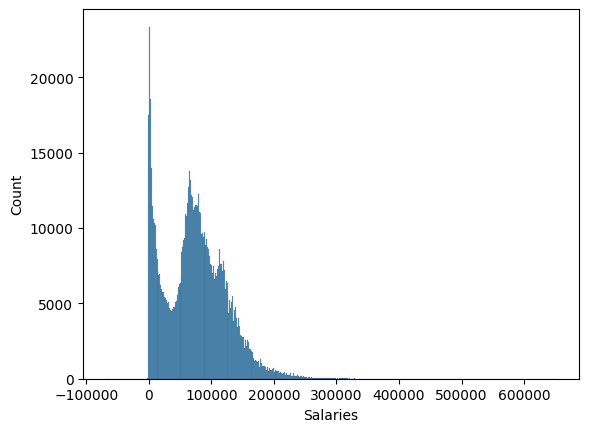

In [51]:
sns.histplot(x = df['Salaries'])

<Axes: xlabel='Salaries', ylabel='Density'>

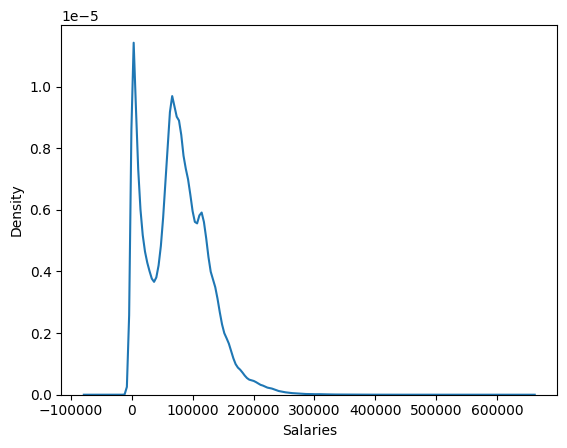

In [52]:
sns.kdeplot(x = df['Salaries'])

In [53]:
df['Salaries'].max()

651936.71

In [54]:
df['Salaries'].min()

-68771.78

<Axes: >

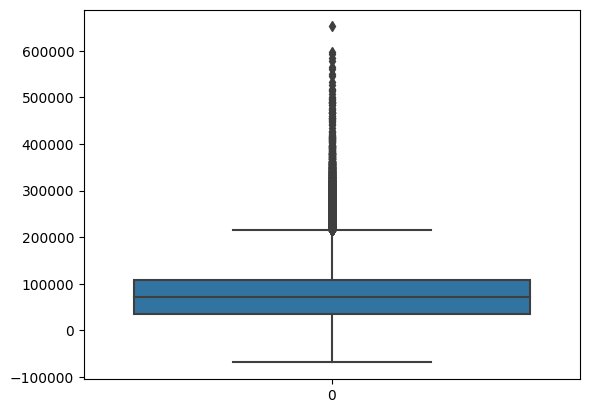

In [55]:
sns.boxplot(df['Salaries'])

In [56]:
df[df['Salaries']>200000].shape

(12183, 22)

In [57]:
# convert the negative value into positive value 
df['Salaries'] = df['Salaries'].apply(lambda x: abs(x) if x < 0 else x)
df[df['Salaries']<0].shape

(0, 22)

In [58]:
df['Salaries'].min()

0.0

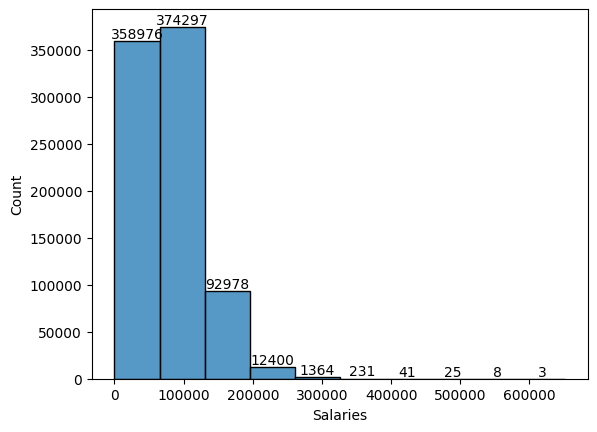

In [59]:
ax = sns.histplot(x = df['Salaries'],bins=10)
barcount(ax)

<Axes: >

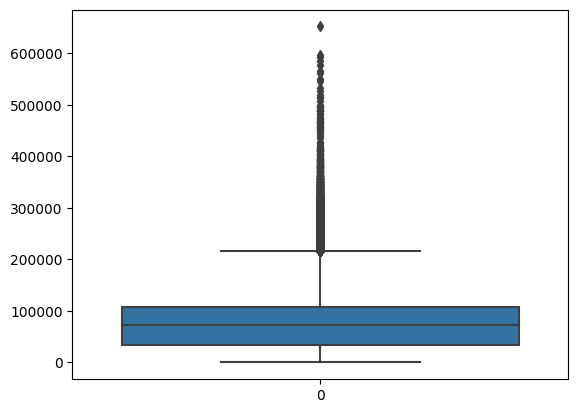

In [60]:
sns.boxplot(df['Salaries'])

## 6.Analysis of Overtime

In [61]:
numeric('Overtime')

no. of missing values in Overtime is 0
mean of Overtime is 6129.045131419704
mode of Overtime is 0    0.0
Name: Overtime, dtype: float64
median of Overtime is 0.0
standard deviation of Overtime is 14784.368138740714


<Axes: xlabel='Overtime'>

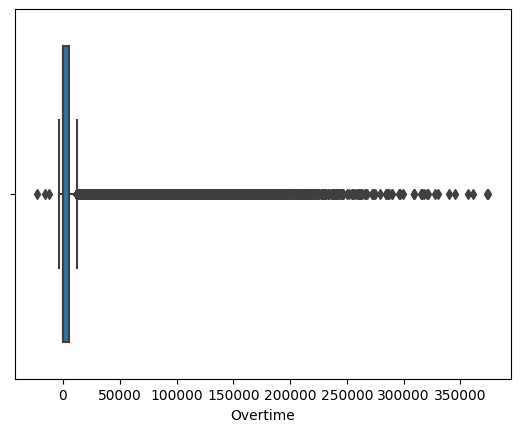

In [62]:
sns.boxplot(x  =df['Overtime'])

In [63]:
df['Overtime'].min()

-22453.28

In [64]:
df['Overtime'].max()

374502.76

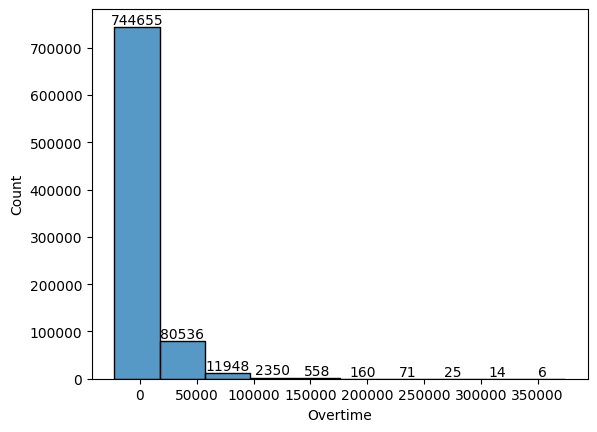

In [65]:
ax = sns.histplot(x=df['Overtime'],bins=10)
barcount(ax)

In [66]:
df[df['Overtime']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
28223,4,2300,2328,Fiscal,2022,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,47226598,13294.12,-1356.76,6187.44,-8463.44,-3035.63,0.00,-618.47,-3654.10,-12117.54
44429,2,9100,9163,Fiscal,2017,"Public Works, Transportation & Commerce",MTA,Municipal Transportation Agcy,253.0,"TWU, Local 250-A, TransitOpr",...,37027920,7151.22,-42.44,270.99,7379.77,1452.41,2423.28,513.66,4389.35,11769.12
53040,6,3300,3376,Fiscal,2021,General Administration & Finance,ADM,Administrative Services,790.0,"SEIU, Local 1021, Misc",...,45732004,62496.80,-606.46,0.00,61890.34,16027.34,15959.10,4934.34,36920.78,98811.12
54345,4,2500,2587,Fiscal,2021,Community Health,DPH,Public Health,790.0,"SEIU, Local 1021, Misc",...,45712002,79255.87,-538.17,2181.00,80898.70,18318.41,15882.36,5926.32,40127.09,121025.79
56579,4,2300,2312,Calendar,2021,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,48286544,83045.81,-1241.25,1760.00,83564.56,18227.04,16132.79,6667.18,41027.01,124591.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794007,6,8100,8106,Fiscal,2014,General Administration & Finance,ADM,ADM Gen Svcs Agency-City Admin,790.0,"SEIU - Miscellaneous, Local 1021",...,51178,4959.50,-130.80,0.00,4828.70,1230.95,1363.31,373.83,2968.09,7796.79
803228,4,2300,2303,Fiscal,2016,Community Health,DPH,DPH Public Health,250.0,"SEIU - Health Workers, Local 1021",...,49611,57027.62,-213.50,3204.70,60018.82,10612.75,13018.09,4810.32,28441.16,88459.98
817586,6,8100,8106,Fiscal,2014,General Administration & Finance,ADM,ADM Gen Svcs Agency-City Admin,790.0,"SEIU - Miscellaneous, Local 1021",...,56186,39309.03,-130.80,0.00,39178.23,9756.52,10241.36,3238.26,23236.14,62414.37
820955,1,H000,H020,Fiscal,2016,Public Protection,FIR,FIR Fire Department,798.0,"Firefighters - Miscellaneous, Local 798",...,55413,18521.37,-311.52,2315.17,20525.02,3677.65,1945.24,350.44,5973.33,26498.35


In [67]:
df['Overtime'] = df['Overtime'].apply(lambda x: abs(x) if x < 0 else x)
df[df['Overtime']<0].shape

(0, 22)

In [68]:
df['Overtime'].min()

0.0

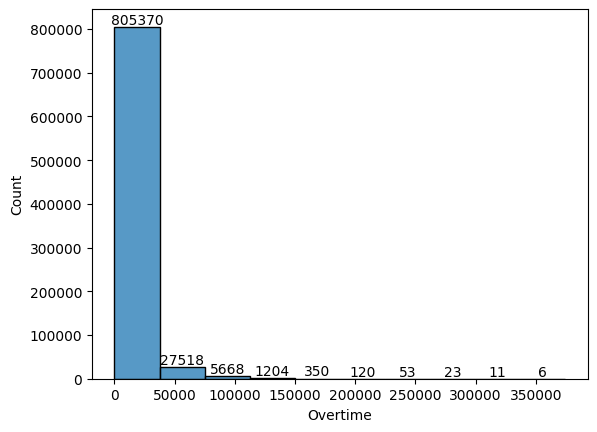

In [69]:
ax = sns.histplot(x=df['Overtime'],bins=10)
barcount(ax)

## 7. Analysis of Other Salaries

In [70]:
numeric('Other Salaries')

no. of missing values in Other Salaries is 0
mean of Other Salaries is 3849.975946618144
mode of Other Salaries is 0    0.0
Name: Other Salaries, dtype: float64
median of Other Salaries is 793.3
standard deviation of Other Salaries is 7715.119336549156


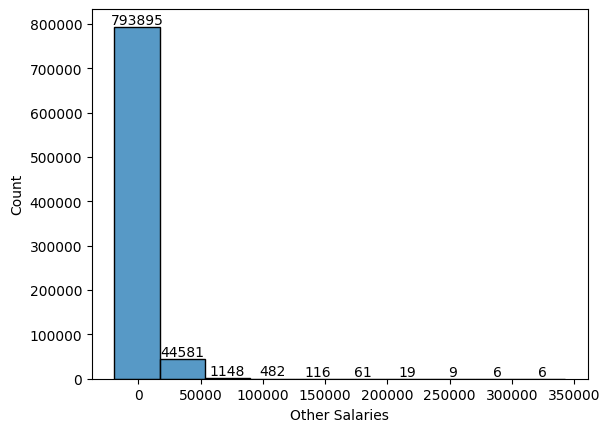

In [71]:
ax = sns.histplot(df['Other Salaries'],bins=10)
barcount(ax)

In [72]:
df[df['Other Salaries']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
5492,4,2500,2589,Fiscal,2019,Community Health,DPH,Public Health,21.0,"Prof & Tech Eng, Local 21",...,39336172,52933.85,189.05,-99.31,53023.59,10098.63,9704.85,4428.58,24232.06,77255.65
21907,2,7300,7332,Fiscal,2021,"Public Works, Transportation & Commerce",PUC,Public Utilities Commission,130.0,"Auto Machinist, Local 1414",...,45734288,102316.92,14285.55,-135.50,116466.97,23053.28,18358.56,9330.54,50742.38,167209.35
42741,2,7300,7308,Fiscal,2017,"Public Works, Transportation & Commerce",AIR,Airport Commission,6.0,"Electrical Workers, Local 6",...,37282865,110900.31,5964.68,-590.00,116274.99,20123.85,15741.68,9131.44,44996.97,161271.96
43247,2,5200,5211,Fiscal,2020,"Public Works, Transportation & Commerce",MTA,Municipal Transportation Agcy,21.0,"Prof & Tech Eng, Local 21",...,42416500,195385.32,0.00,-1744.01,193641.31,39419.38,14797.85,12198.22,66415.45,260056.76
49341,4,2300,2328,Fiscal,2020,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,41466178,2428.50,0.00,-91.08,-2519.58,-285.42,0.00,-118.11,-403.53,-2923.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805027,1,8100,8126,Calendar,2016,Public Protection,POL,POL Police,200.0,"Transportation Workers, Local 200",...,50029,50130.45,0.00,-2.40,50128.05,9138.30,6171.25,4041.21,19350.76,69478.81
813902,4,2300,2320,Fiscal,2016,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,48582,132298.02,0.00,-530.15,131767.87,23985.61,12302.17,10160.64,46448.42,178216.29
816338,1,8100,8126,Calendar,2016,Public Protection,POL,POL Police,200.0,"Transportation Workers, Local 200",...,56105,50130.46,0.00,-2.40,50128.06,9138.30,6171.25,3873.22,19182.77,69310.83
821175,4,2500,2583,Fiscal,2016,Community Health,DPH,DPH Public Health,250.0,"SEIU - Health Workers, Local 1021",...,56015,34491.60,270.00,-216.00,34545.60,7117.62,11658.93,2802.83,21579.38,56124.98


In [73]:
df['Other Salaries'] =df['Other Salaries'].abs()

df[df['Other Salaries']<0].shape

(0, 22)

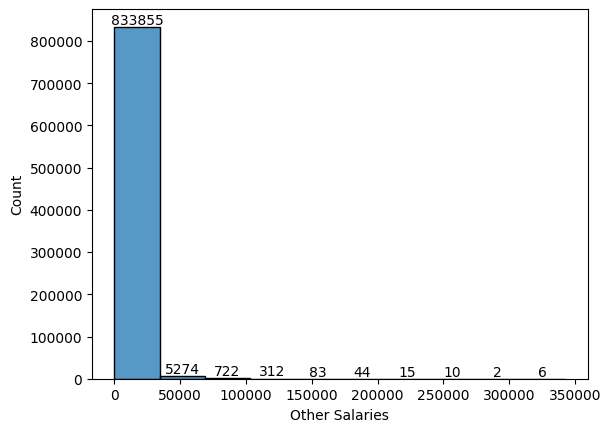

In [74]:
ax = sns.histplot(df['Other Salaries'],bins=10)
barcount(ax)

In [75]:
df['Other Salaries'].min()

0.0

## 8. Analysis of Total Salary

In [76]:
numeric('Total Salary')

no. of missing values in Total Salary is 0
mean of Total Salary is 84421.98317921799
mode of Total Salary is 0    250.0
Name: Total Salary, dtype: float64
median of Total Salary is 80170.51
standard deviation of Total Salary is 58948.164988486606


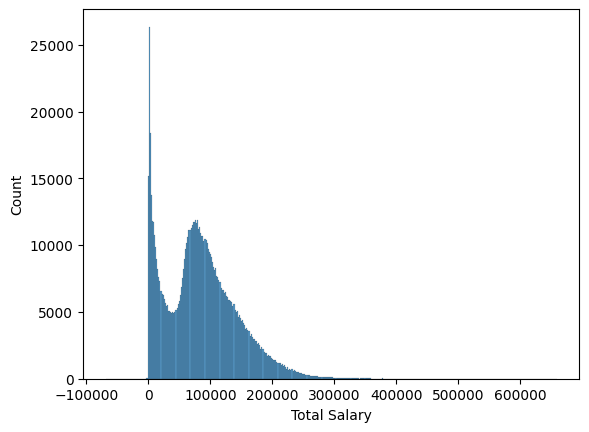

In [77]:
ax = sns.histplot(x=df['Total Salary'])

<Axes: >

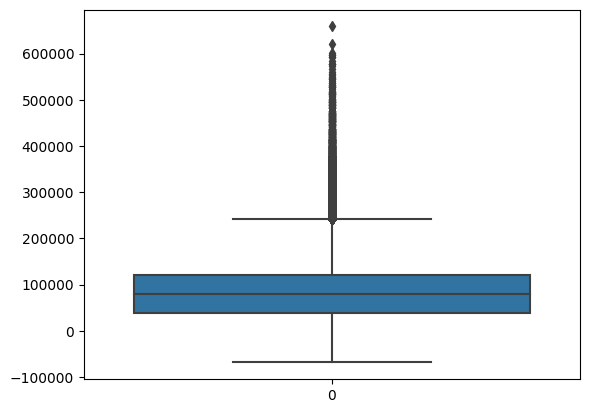

In [78]:
sns.boxplot(df['Total Salary'])

In [79]:
df[df['Total Salary']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
5023,2,1000,1053,Fiscal,2019,"Public Works, Transportation & Commerce",AIR,Airport Commission,21.0,"Prof & Tech Eng, Local 21",...,37206030,5315.87,0.00,0.00,-5315.87,-992.80,0.00,-418.90,-1411.70,-6727.57
5789,4,2600,2622,Fiscal,2019,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,38476126,2750.71,83.44,85.55,-2581.72,-622.48,1761.37,-210.72,928.17,-1653.55
28223,4,2300,2328,Fiscal,2022,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,47226598,13294.12,1356.76,6187.44,-8463.44,-3035.63,0.00,-618.47,-3654.10,-12117.54
36266,6,1200,1280,Fiscal,2019,General Administration & Finance,HRD,Human Resources,1.0,Misc. Unrepresented Employees,...,37479356,3154.50,0.00,0.00,-3154.50,-607.15,668.86,-188.17,-126.46,-3280.96
49341,4,2300,2328,Fiscal,2020,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,41466178,2428.50,0.00,91.08,-2519.58,-285.42,0.00,-118.11,-403.53,-2923.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805090,5,0900,0114,Fiscal,2016,Culture & Recreation,REC,REC Recreation & Park Commsn,323.0,Members of Boards and Commissions,...,50239,300.00,0.00,0.00,-300.00,0.00,-18.70,-23.23,-41.93,-341.93
805479,4,6100,6108,Fiscal,2015,Community Health,DPH,DPH Public Health,790.0,"SEIU - Miscellaneous, Local 1021",...,50176,1110.50,0.00,0.00,-1110.50,-236.76,-239.48,-85.98,-562.22,-1672.72
829851,1,Q000,Q004,Fiscal,2013,Public Protection,POL,POL Police,911.0,Police Officers' Association,...,54085,2251.50,438.22,0.00,-1813.28,-339.75,0.00,-30.83,-370.58,-2183.86
834656,2,9900,9920,Fiscal,2015,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,790.0,"SEIU - Miscellaneous, Local 1021",...,53641,1261.80,0.00,0.00,-1261.80,0.00,-431.05,-97.69,-528.74,-1790.54


In [80]:
df['Total Salary'] =df['Total Salary'].abs()
df[df['Total Salary']<0].shape


(0, 22)

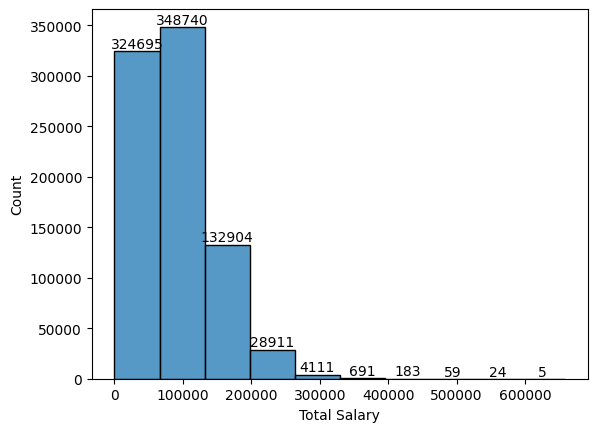

In [81]:
ax = sns.histplot(x=df['Total Salary'],bins=10)
barcount(ax)

## 9.Analysis of Retirement

In [82]:
numeric('Retirement')

no. of missing values in Retirement is 0
mean of Retirement is 15097.144051918127
mode of Retirement is 0    0.0
Name: Retirement, dtype: float64
median of Retirement is 15099.81
standard deviation of Retirement is 11328.348586117814


<Axes: xlabel='Retirement', ylabel='Count'>

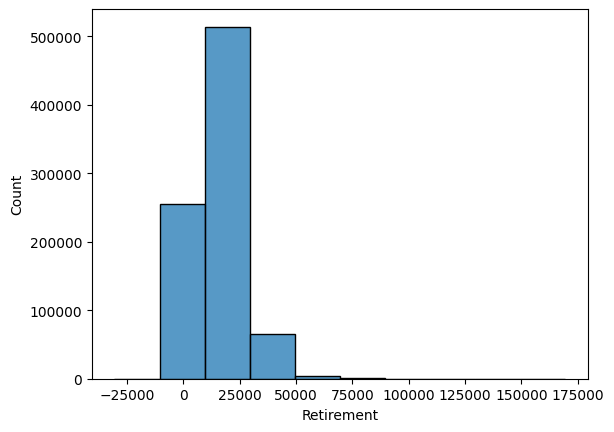

In [83]:
sns.histplot(x = df['Retirement'],bins=10)

<Axes: >

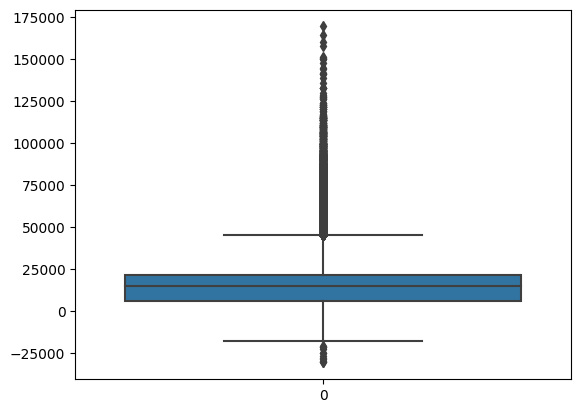

In [84]:
sns.boxplot(df['Retirement'])

In [85]:
df[df['Retirement']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
685,4,2300,P103,Fiscal,2018,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,36972092,135162.10,16715.24,20819.84,172697.18,-15165.55,0.00,10648.23,-4517.32,168179.86
738,4,2300,P103,Fiscal,2018,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,36676368,143490.49,614.30,337.88,144442.67,-24818.10,0.00,10051.63,-14766.47,129676.20
5023,2,1000,1053,Fiscal,2019,"Public Works, Transportation & Commerce",AIR,Airport Commission,21.0,"Prof & Tech Eng, Local 21",...,37206030,5315.87,0.00,0.00,5315.87,-992.80,0.00,-418.90,-1411.70,-6727.57
5789,4,2600,2622,Fiscal,2019,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,38476126,2750.71,83.44,85.55,2581.72,-622.48,1761.37,-210.72,928.17,-1653.55
5963,2,9900,9910,Fiscal,2019,"Public Works, Transportation & Commerce",ECN,Economic Workforce Development,790.0,"SEIU, Local 1021, Misc",...,37395914,0.00,0.00,353.91,353.91,-82.83,0.00,27.07,-55.76,298.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
833309,4,2600,2622,Fiscal,2016,Community Health,DPH,DPH Public Health,250.0,"SEIU - Health Workers, Local 1021",...,54540,846.09,0.00,2535.79,1689.70,-189.78,0.00,126.98,-62.80,1626.90
837282,4,2300,P103,Calendar,2013,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,52970,776.85,0.00,129.48,906.33,-0.02,71.77,401.77,473.52,1379.85
837467,4,2300,P103,Fiscal,2013,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,53453,3346.20,0.00,111.54,3457.74,-0.01,295.43,0.00,295.42,3753.16
837652,3,2900,2996,Fiscal,2013,Human Welfare & Neighborhood Development,HRC,HRC Human Rights Commission,790.0,"SEIU - Miscellaneous, Local 1021",...,53961,17635.32,0.00,782.28,16853.04,-3190.24,-2940.47,-1378.51,-7509.22,-24362.26


In [86]:
df['Retirement'] =df['Retirement'].abs()
df[df['Retirement']<0].shape

(0, 22)

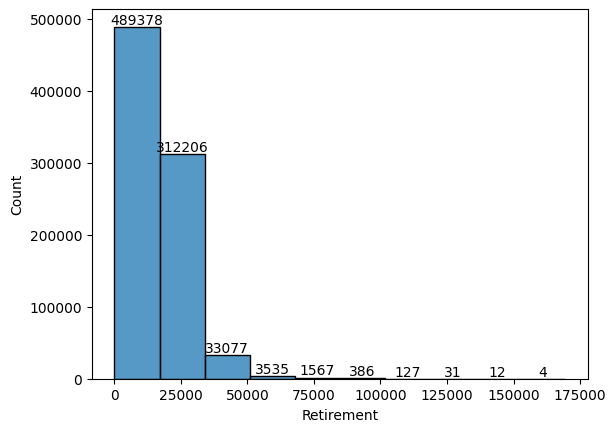

In [87]:
ax = sns.histplot(x = df['Retirement'],bins=10)
barcount(ax)

## 10. Analysis of Health and Dental

In [88]:
numeric('Health and Dental')

no. of missing values in Health and Dental is 0
mean of Health and Dental is 10073.59296613326
mode of Health and Dental is 0    0.0
Name: Health and Dental, dtype: float64
median of Health and Dental is 12530.99
standard deviation of Health and Dental is 6362.931394299454


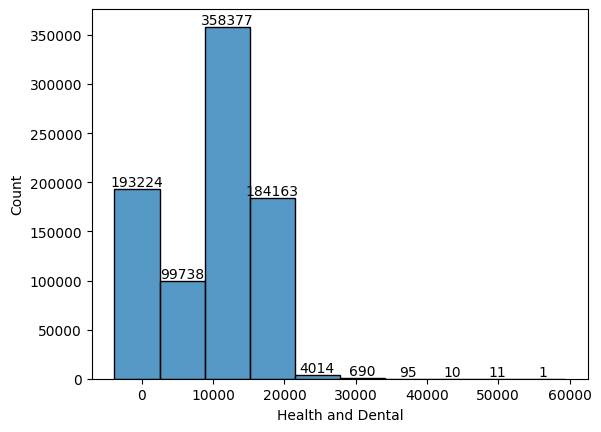

In [89]:
ax = sns.histplot(x = df['Health and Dental'],bins=10)
barcount(ax)

<Axes: >

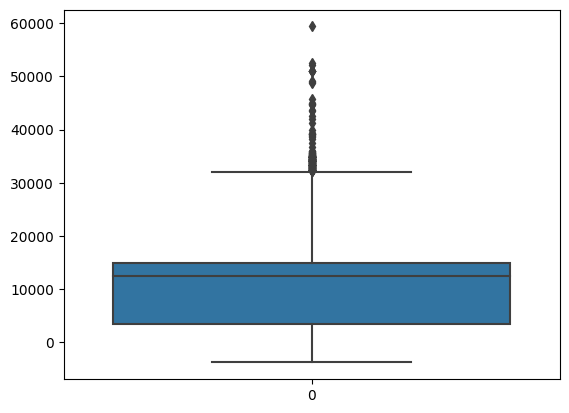

In [90]:
sns.boxplot(df['Health and Dental'])

In [91]:
df[df['Health and Dental']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
62996,1,Q000,Q004,Fiscal,2019,Public Protection,POL,Police,911.0,POA,...,37395796,27.63,0.0,0.18,27.81,5.09,-0.30,-0.39,-5.78,-33.59
78666,4,2400,2430,Calendar,2017,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,37331289,0.00,0.0,0.00,0.00,0.00,-3831.09,202.31,-3628.78,-3628.78
158490,4,2600,2604,Fiscal,2018,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,37209680,477.92,0.0,933.74,1411.66,17.78,-27.44,110.26,65.04,1476.70
180504,4,2300,2303,Fiscal,2021,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,43726174,3158.00,0.0,307.98,3465.98,732.09,-613.81,-272.20,-1618.10,-5084.08
194583,6,8100,8177,Fiscal,2019,General Administration & Finance,CAT,City Attorney,311.0,Municipal Attorneys Assoc,...,37676623,7421.53,0.0,1686.53,5735.00,1372.34,-723.26,-377.27,-2472.87,-8207.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834656,2,9900,9920,Fiscal,2015,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,790.0,"SEIU - Miscellaneous, Local 1021",...,53641,1261.80,0.0,0.00,1261.80,0.00,-431.05,-97.69,-528.74,-1790.54
837349,3,2900,2905,Fiscal,2014,Human Welfare & Neighborhood Development,DSS,HSA Human Services Agency,535.0,"SEIU - Human Services, Local 1021",...,53107,56.23,0.0,8437.00,8493.23,10.17,-193.95,649.87,466.09,8959.32
837652,3,2900,2996,Fiscal,2013,Human Welfare & Neighborhood Development,HRC,HRC Human Rights Commission,790.0,"SEIU - Miscellaneous, Local 1021",...,53961,17635.32,0.0,782.28,16853.04,3190.24,-2940.47,-1378.51,-7509.22,-24362.26
837729,2,7300,7309,Calendar,2014,"Public Works, Transportation & Commerce",MTA,MTA Municipal Transprtn Agncy,130.0,"Automotive Machinists, Local 1414",...,53045,0.00,0.0,439.48,439.48,0.00,-3.85,33.62,29.77,469.25


In [92]:
df['Health and Dental'] =df['Health and Dental'].abs()
df[df['Health and Dental']<0].shape

(0, 22)

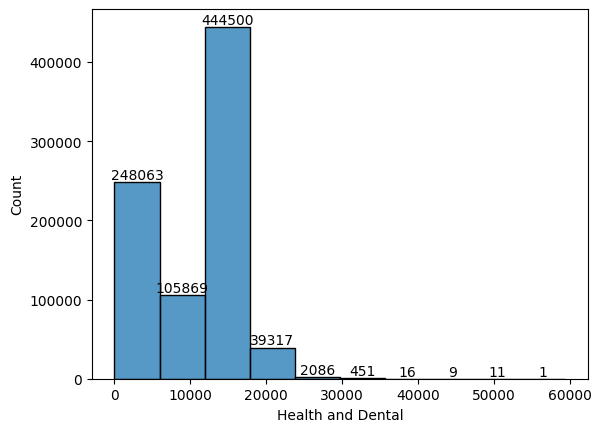

In [93]:
ax = sns.histplot(x = df['Health and Dental'],bins=10)
barcount(ax)

## 11. Analysis of Other Benefits

In [94]:
numeric('Other Benefits')

no. of missing values in Other Benefits is 0
mean of Other Benefits is 5333.475235236926
mode of Other Benefits is 0    0.0
Name: Other Benefits, dtype: float64
median of Other Benefits is 5224.66
standard deviation of Other Benefits is 3805.2227105780225


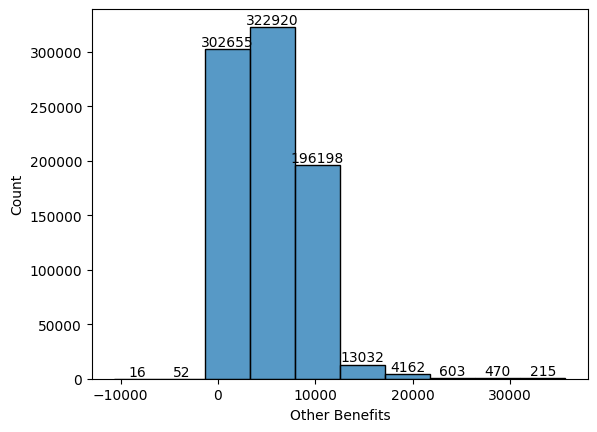

In [95]:
ax = sns.histplot(df['Other Benefits'],bins=10)
barcount(ax)


In [96]:
df[df['Other Benefits']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
5023,2,1000,1053,Fiscal,2019,"Public Works, Transportation & Commerce",AIR,Airport Commission,21.0,"Prof & Tech Eng, Local 21",...,37206030,5315.87,0.00,0.00,5315.87,992.80,0.00,-418.90,-1411.70,-6727.57
5789,4,2600,2622,Fiscal,2019,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,38476126,2750.71,83.44,85.55,2581.72,622.48,1761.37,-210.72,928.17,-1653.55
6583,6,9900,9920,Fiscal,2018,General Administration & Finance,ADM,Administrative Services,790.0,"SEIU, Local 1021, Misc",...,37088613,7086.50,0.00,0.00,7086.50,0.00,0.00,-62.02,-62.02,7024.48
22527,1,Q000,Q004,Fiscal,2021,Public Protection,POL,Police,911.0,POA,...,46526502,108784.03,0.00,15850.58,124634.61,24447.80,13508.40,-239.36,37716.84,162351.45
23552,2,9100,9163,Fiscal,2021,"Public Works, Transportation & Commerce",MTA,Municipal Transportation Agcy,253.0,"TWU, Local 250-A, TransitOpr",...,45701779,0.00,0.00,250.00,250.00,0.00,0.00,-36.60,-36.60,213.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
839945,4,2300,P103,Fiscal,2015,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,53484,6263.75,0.00,124.69,6388.44,411.44,0.00,-0.04,411.40,6799.84
839946,4,2300,P103,Fiscal,2014,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,53484,2043.30,0.00,87.57,2130.87,2187.87,0.00,-0.03,2187.84,4318.71
839948,4,2300,P103,Calendar,2015,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,53484,4731.00,0.00,94.62,4825.62,205.56,0.00,-0.01,205.55,5031.17
839949,4,2300,P103,Calendar,2014,Community Health,DPH,DPH Public Health,791.0,"SEIU - Staff and Per Diem Nurses, Local 1021",...,53484,1824.65,0.00,59.26,1883.91,1230.16,0.00,-0.05,1230.11,3114.02


In [97]:
df['Other Benefits'] =df['Other Benefits'].abs()
df[df['Other Benefits']<0].shape

(0, 22)

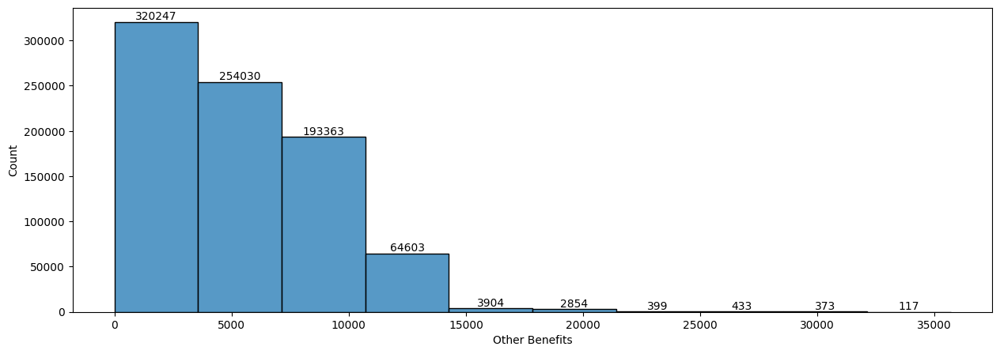

In [98]:
fig,ax = plt.subplots(figsize=(15,5))
ax = sns.histplot(df['Other Benefits'],bins=10)
barcount(ax)

## 12.Analysis of Total Benefits

In [99]:

numeric('Total Benefits')

no. of missing values in Total Benefits is 0
mean of Total Benefits is 30504.2122532883
mode of Total Benefits is 0    0.0
Name: Total Benefits, dtype: float64
median of Total Benefits is 33853.02
standard deviation of Total Benefits is 19058.00153175874


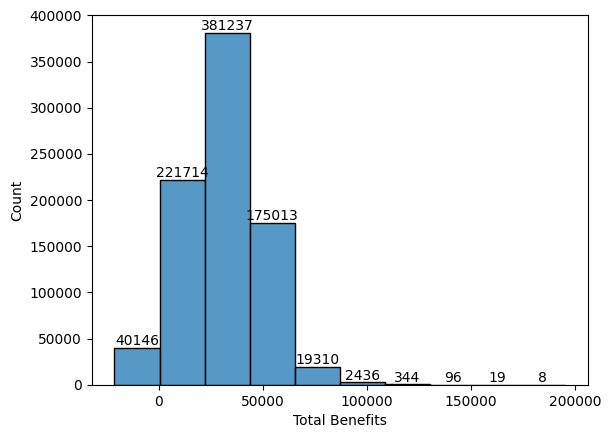

In [100]:
ax = sns.histplot(df['Total Benefits'],bins=10)
barcount(ax)

In [101]:
df[df['Total Benefits']<0].shape

(523, 22)

In [102]:
df['Total Benefits'] =df['Total Benefits'].abs()
df[df['Total Benefits']<0].shape

(0, 22)

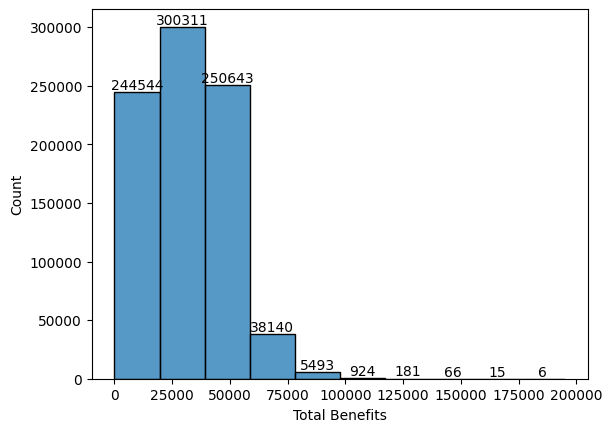

In [103]:
ax = sns.histplot(df['Total Benefits'],bins=10)
barcount(ax)

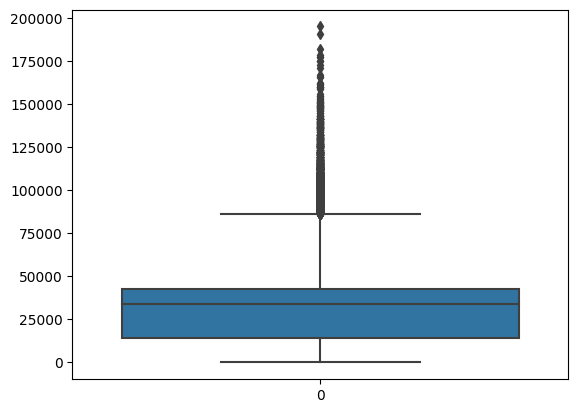

In [104]:
ax = sns.boxplot(df['Total Benefits'])


## 13. Analysis of Total Compensation ----Target Variable

In [105]:
numeric('Total Compensation')

no. of missing values in Total Compensation is 0
mean of Total Compensation is 114926.19543250624
mode of Total Compensation is 0    268.74
Name: Total Compensation, dtype: float64
median of Total Compensation is 114299.25
standard deviation of Total Compensation is 76313.12552712648


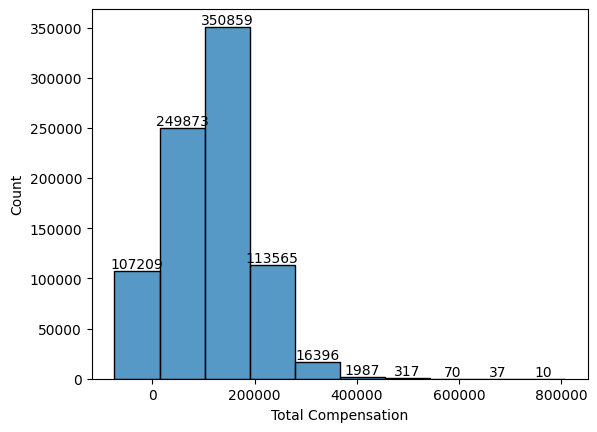

In [106]:
ax = sns.histplot(df['Total Compensation'],bins=10)
barcount(ax)

In [107]:
df[df['Total Compensation']<0]

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
5023,2,1000,1053,Fiscal,2019,"Public Works, Transportation & Commerce",AIR,Airport Commission,21.0,"Prof & Tech Eng, Local 21",...,37206030,5315.87,0.00,0.00,5315.87,992.80,0.00,418.90,1411.70,-6727.57
5789,4,2600,2622,Fiscal,2019,Community Health,DPH,Public Health,250.0,"SEIU, Local 1021, Misc",...,38476126,2750.71,83.44,85.55,2581.72,622.48,1761.37,210.72,928.17,-1653.55
28223,4,2300,2328,Fiscal,2022,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,47226598,13294.12,1356.76,6187.44,8463.44,3035.63,0.00,618.47,3654.10,-12117.54
36266,6,1200,1280,Fiscal,2019,General Administration & Finance,HRD,Human Resources,1.0,Misc. Unrepresented Employees,...,37479356,3154.50,0.00,0.00,3154.50,607.15,668.86,188.17,126.46,-3280.96
49341,4,2300,2328,Fiscal,2020,Community Health,DPH,Public Health,791.0,"SEIU, Local 1021, RN",...,41466178,2428.50,0.00,91.08,2519.58,285.42,0.00,118.11,403.53,-2923.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
829851,1,Q000,Q004,Fiscal,2013,Public Protection,POL,POL Police,911.0,Police Officers' Association,...,54085,2251.50,438.22,0.00,1813.28,339.75,0.00,30.83,370.58,-2183.86
830672,6,1600,1630,Calendar,2013,General Administration & Finance,TTX,TTX Treasurer/Tax Collector,790.0,"SEIU - Miscellaneous, Local 1021",...,54094,0.00,0.00,0.00,0.00,0.00,7.59,17.74,10.15,-10.15
832358,2,7300,7371,Calendar,2014,"Public Works, Transportation & Commerce",MTA,MTA Municipal Transprtn Agncy,6.0,"Electrical Workers, Local 6",...,54187,0.00,0.00,0.00,0.00,0.00,3.85,0.18,3.67,-3.67
834656,2,9900,9920,Fiscal,2015,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,790.0,"SEIU - Miscellaneous, Local 1021",...,53641,1261.80,0.00,0.00,1261.80,0.00,431.05,97.69,528.74,-1790.54


In [108]:
df['Total Compensation'] =df['Total Compensation'].abs()
df[df['Total Compensation']<0].shape

(0, 22)

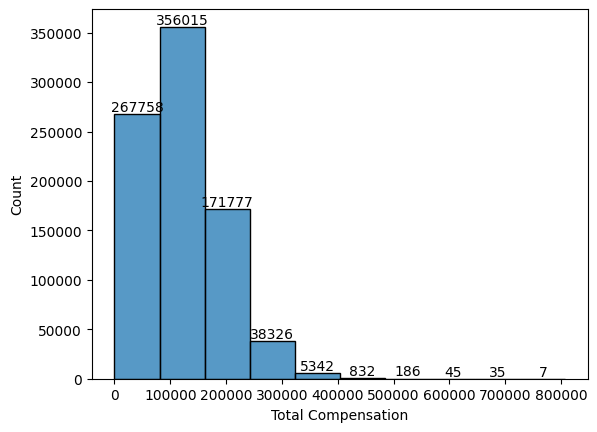

In [109]:
ax = sns.histplot(df['Total Compensation'],bins=10)
barcount(ax)

In [110]:
df.head()

,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
0,3,1400,1404,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,790.0,"SEIU, Local 1021, Misc",...,37486688,60720.01,0.00,0.00,60720.01,13653.20,14733.76,4904.34,33291.30,94011.31
1,3,9700,9703,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,39646203,91677.00,0.00,0.00,91677.00,17524.20,14733.76,7411.13,39669.09,131346.09
2,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37486043,89106.03,0.00,1540.00,90646.03,17327.20,14733.76,7401.92,39462.88,130108.91
3,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37615772,85581.11,3355.94,337.75,89274.80,16359.16,14151.56,7096.21,37606.93,126881.73
4,3,2900,2905,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,37500212,86457.00,0.00,2090.00,88547.00,16925.97,14733.76,7257.89,38917.62,127464.62


In [111]:
is_equal = (df['Salaries'] + df['Overtime'] + df['Other Salaries']) == df['Total Salary']
# df[~is_equal]
is_equal.value_counts()

True     688614
False    151709
Name: count, dtype: int64

In [112]:
is_equal = (df['Retirement'] + df['Health and Dental'] + df['Other Benefits']) == df['Other Benefits']
is_equal.value_counts()

False    774427
True      65896
Name: count, dtype: int64

In [113]:
is_equal = (df['Total Salary'] + df['Total Benefits']) == df['Total Compensation']
is_equal.value_counts()

True     660509
False    179814
Name: count, dtype: int64

# Level 2 Analysis --Categorical Analysis

In [114]:
category.columns

Index(['Job Family Code', 'Job Code', 'Year Type', 'Organization Group',
       'Department Code', 'Department', 'Union', 'Job Family', 'Job'],
      dtype='object')

## 1. Analysis of Job Family Code Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\1774969107.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


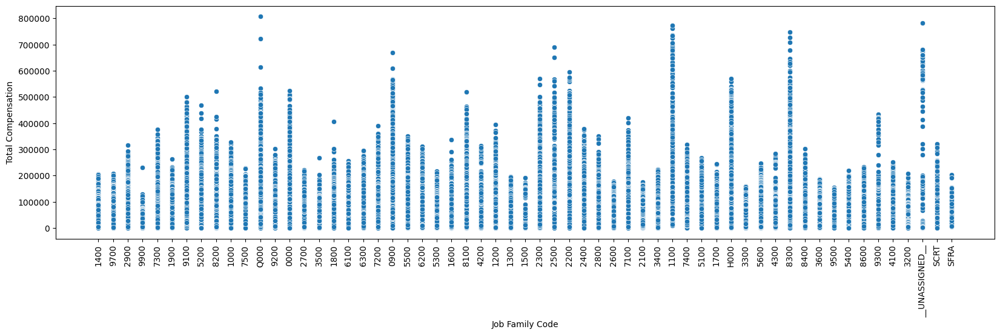

In [115]:
fig,ax = plt.subplots(figsize=(20,5))
ax = sns.scatterplot(x = df['Job Family Code'],y=df['Total Compensation'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

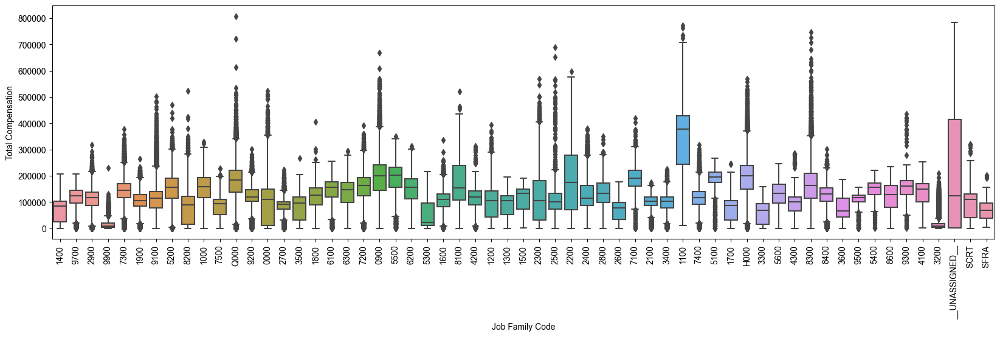

In [116]:
fig,ax = plt.subplots(figsize=(20,5))
sns.set(style="darkgrid")
ax = sns.boxplot(x = 'Job Family Code',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\1926355972.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


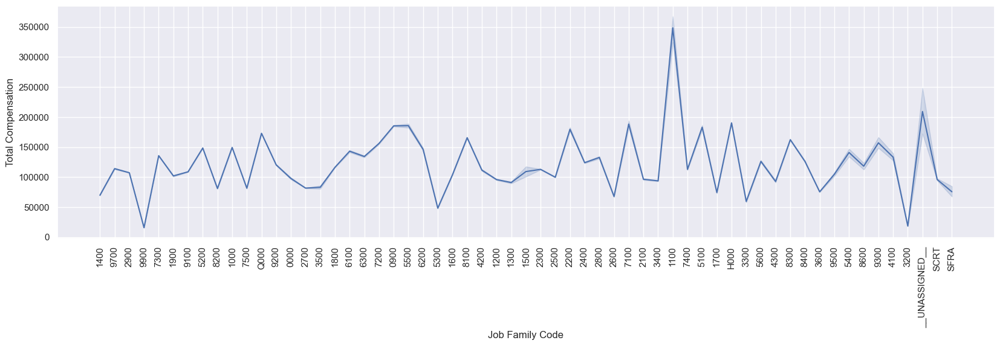

In [117]:
fig,ax = plt.subplots(figsize=(20,5))
sns.set(style="darkgrid")
ax = sns.lineplot(x = 'Job Family Code',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

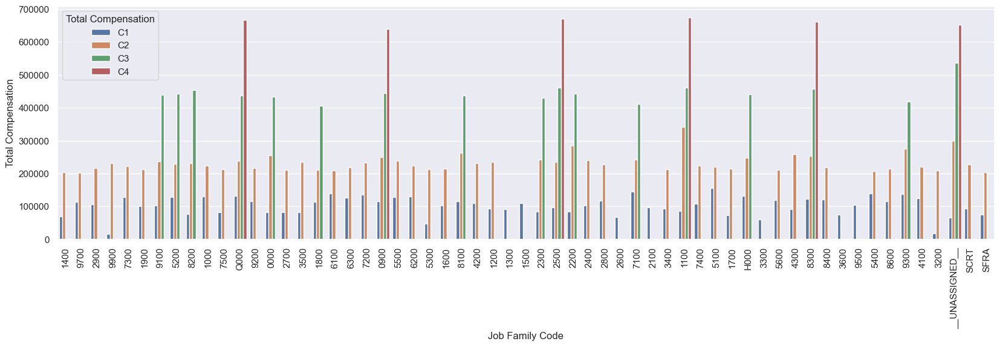

In [118]:
bins = [0,200000,400000,600000,800000]
labels = ['C1','C2','C3','C4']

fig, ax = plt.subplots( figsize=(20, 5))

salary_group = pd.cut(df['Total Compensation'], bins=bins, labels=labels)


ax  = sns.barplot(data=df, x='Job Family Code', y='Total Compensation', hue=salary_group,errorbar=None)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

# df[df['Total Compensation']>800000] -- only 1 column over 800000

## 2. Analysis of Job Code and  Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\3079406262.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


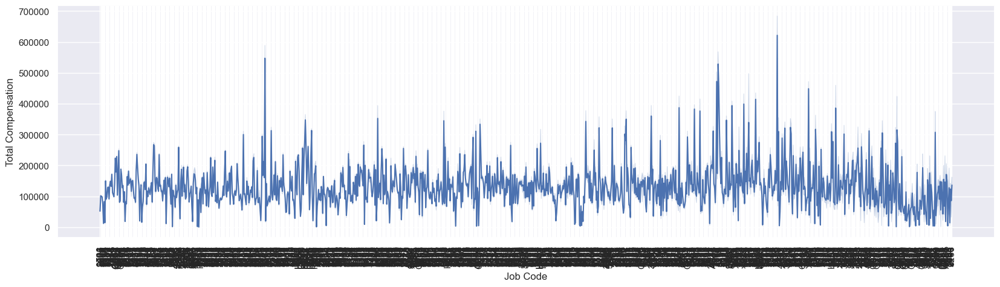

In [119]:
fig,ax = plt.subplots(figsize=(20,5))
sns.set(style="darkgrid")
ax = sns.lineplot(x = 'Job Code',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

In [120]:
df['Job Code'].nunique()

1225

In [121]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import pandas as pd

# # Assuming you have a DataFrame named 'df' with columns 'job_family_code' and 'total_compensation'

# # Define the bins and labels
# bins = [0, 200000, 400000, 600000, 800000]
# labels = ['C1', 'C2', 'C3', 'C4']

# # Create a new column with bin labels
# df['compensation_bin'] = pd.cut(df['Total Compensation'], bins=bins, labels=labels)

# # Get the unique job family codes
# job_family_codes = df['Job Code'].unique()

# # Calculate the number of subplots needed
# num_subplots = len(job_family_codes) // 100 + 1

# # Set the style of the plots
# sns.set(style="darkgrid")

# # Create the subplots
# fig, axs = plt.subplots(num_subplots, 1, figsize=(10, 6*num_subplots), sharex=True)

# # Loop through each subplot and plot the data
# for i, ax in enumerate(axs):
#     # Get the start and end indices for the job family codes in the current subplot
#     start_idx = i * 10
#     end_idx = (i + 1) * 10

#     # Get the job family codes for the current subplot
#     job_family_codes_subplot = job_family_codes[start_idx:end_idx]

#     # Filter the data for the job family codes in the current subplot
#     df_subplot = df[df['Job Code'].isin(job_family_codes_subplot)]

#     # Create the bar plot for the current subplot
#     sns.barplot(ax=ax, x='Job Code', y='Total Compensation', hue='compensation_bin', data=df_subplot)

#     # Set the labels and title for the current subplot
#     ax.set_xlabel('Job Family Code')
#     ax.set_ylabel('Total Compensation')
#     ax.set_title(f'Subplot {i+1}')

#     # Rotate the x-axis labels if needed
#     ax.tick_params(axis='x', rotation=45)

# # Adjust the spacing between subplots
# plt.tight_layout()

# # Show the plots
# plt.show()


## 3. Analysis of Year Type and Total Compensation 

In [122]:
# ax = sns.countplot(data=df, x='Year Type', hue='Total Compensation')

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\74801798.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


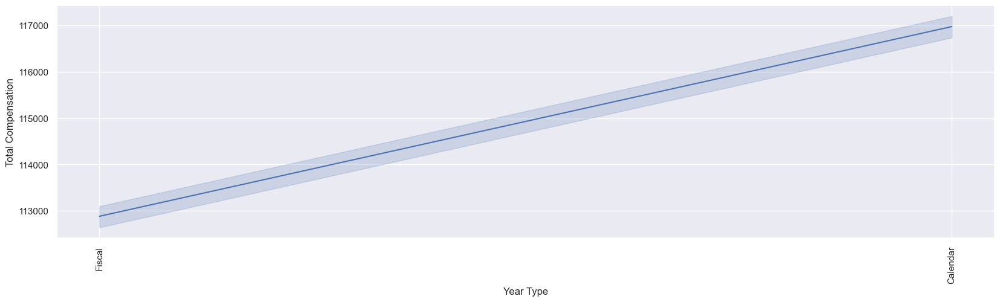

In [123]:
fig,ax = plt.subplots(figsize=(20,5))
sns.set(style="darkgrid")
ax = sns.lineplot(x = 'Year Type',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\643463483.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


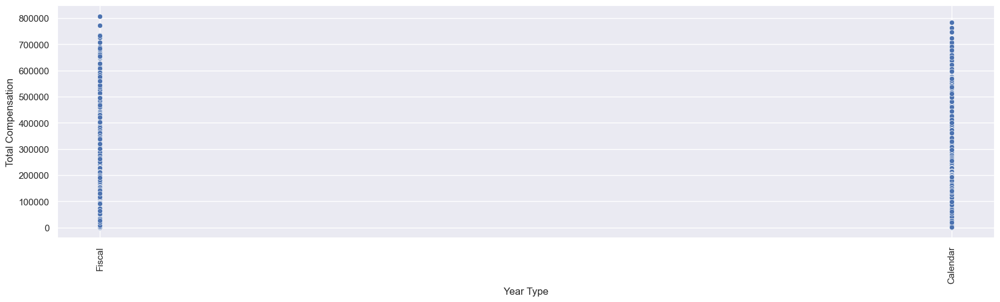

In [124]:
fig,ax = plt.subplots(figsize=(20,5))
ax = sns.scatterplot(x = df['Year Type'],y=df['Total Compensation'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

In [125]:
# bins = [0,200000,400000,600000,800000]
# labels = ['C1','C2','C3','C4']

# fig, ax = plt.subplots( figsize=(20, 5))

# salary_group = pd.cut(df['Total Compensation'], bins=bins, labels=labels)


# ax  = sns.barplot(data=df, x='Year Type', y='Total Compensation', hue=salary_group,errorbar=None)
# ax.set_xticklabels(ax.get_xticklabels(), rotation=90);
# barcount(ax)

## 4.  Analysis of Organization Group and Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\2161302734.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


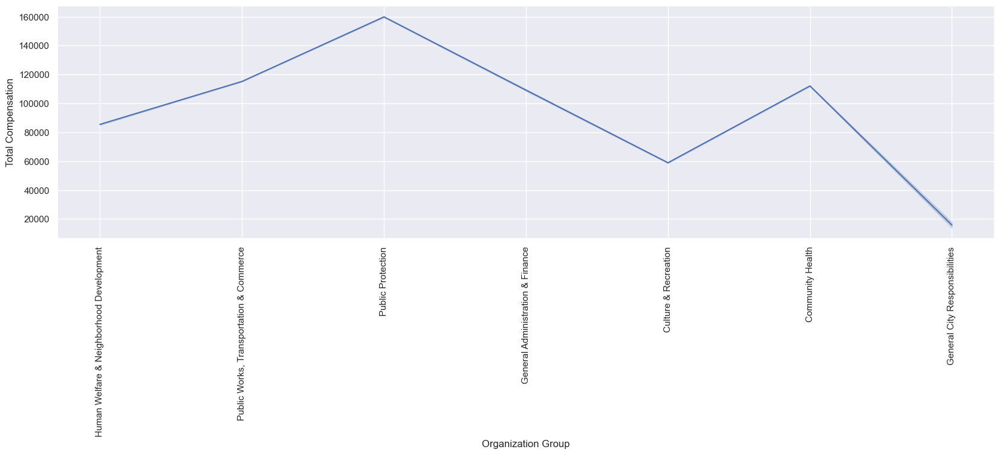

In [126]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Organization Group',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);



C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\2323778639.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30);


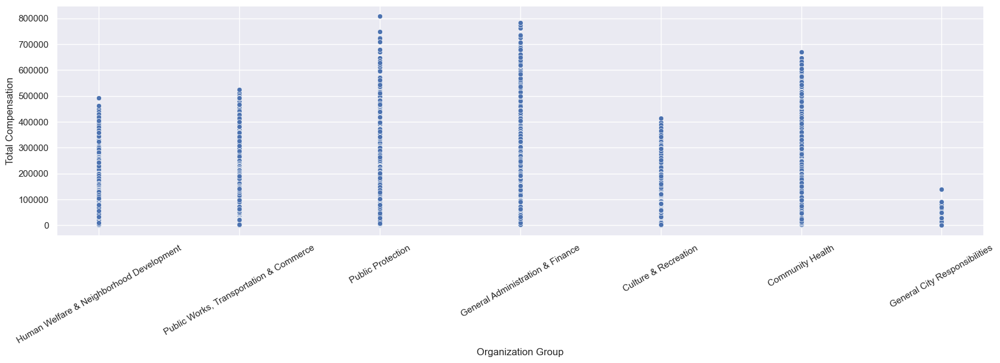

In [127]:
fig,ax = plt.subplots(figsize=(20,5))
ax = sns.scatterplot(x = df['Organization Group'],y=df['Total Compensation'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=30);

In [128]:
e = df[df['Organization Group']=='Human Welfare & Neighborhood Development']
e['Total Compensation'].mean()

85484.99906021154

##  5. Analysis of Department Code and Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\3087754108.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


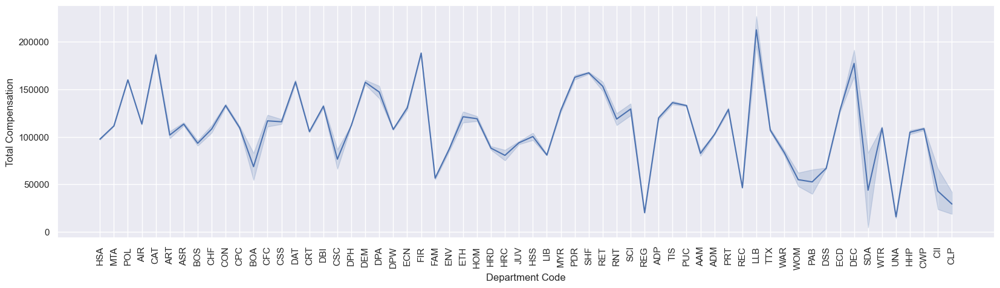

In [129]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Department Code',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


## 6.Analysis of Department and Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\4223100967.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


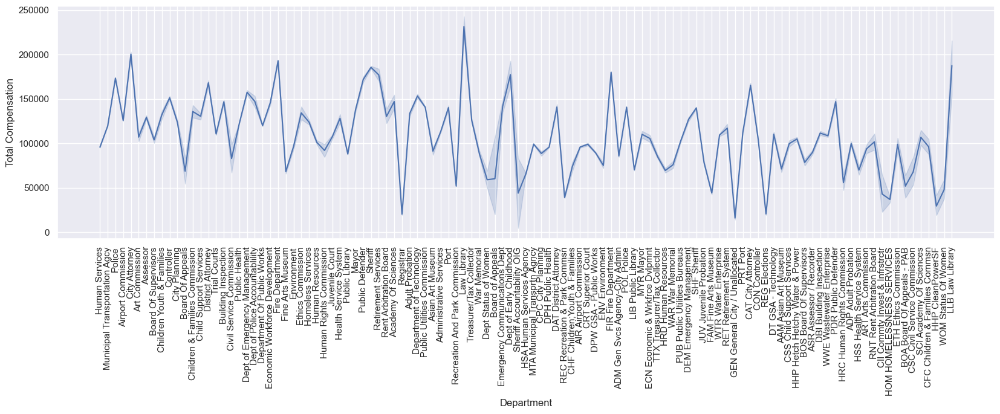

In [130]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Department',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


## 7. Analysis of  union and Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\2802491377.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


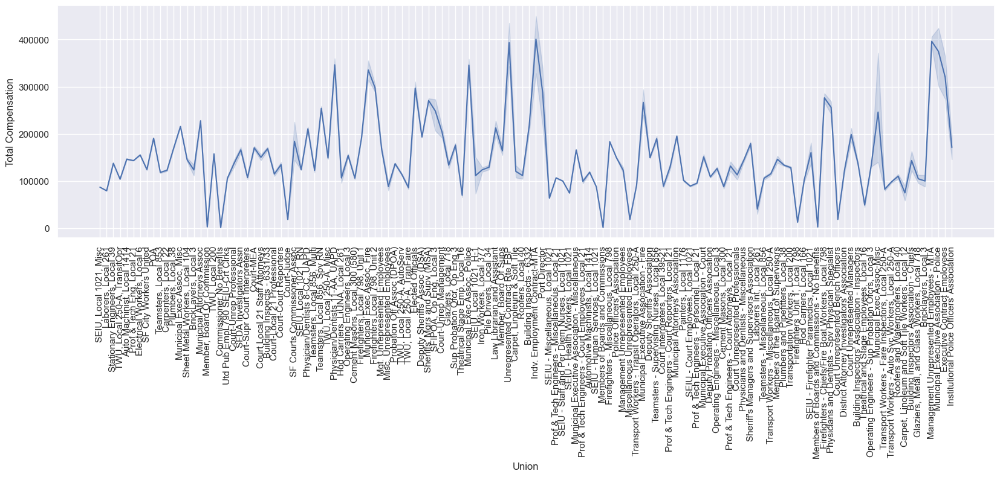

In [131]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Union',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


## 8. Analysis of Job Family and Totall Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\3905358251.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


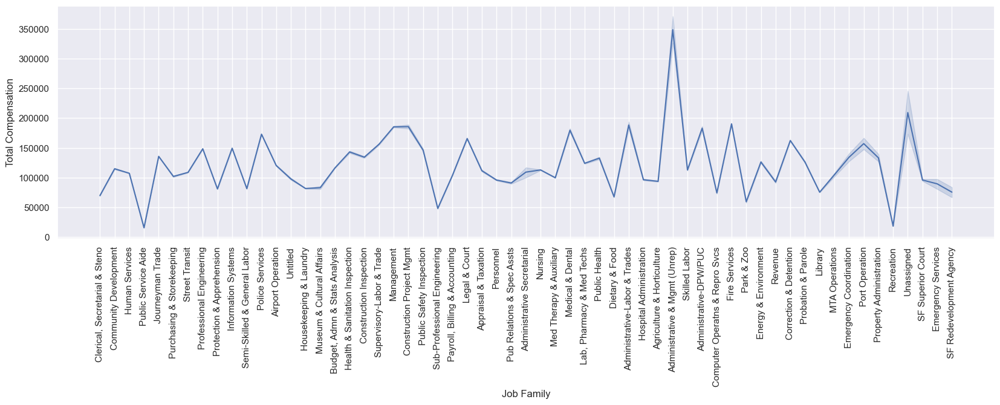

In [132]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Job Family',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

## 9. Analysis of Job and Total Compensation

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\2851224973.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


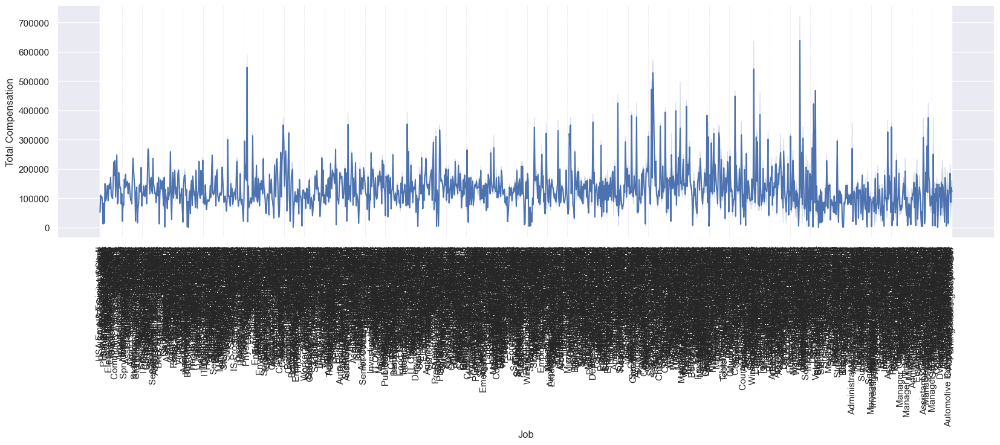

In [133]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Job',y='Total Compensation',data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

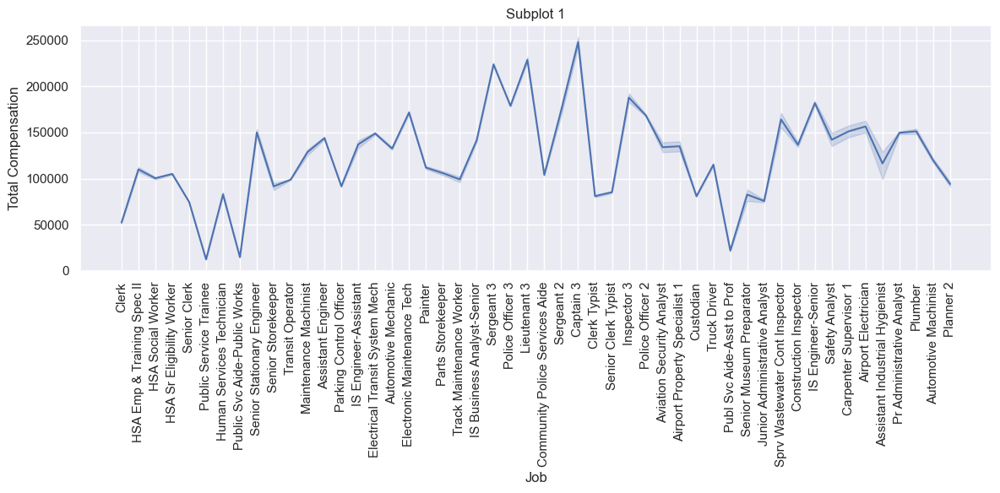

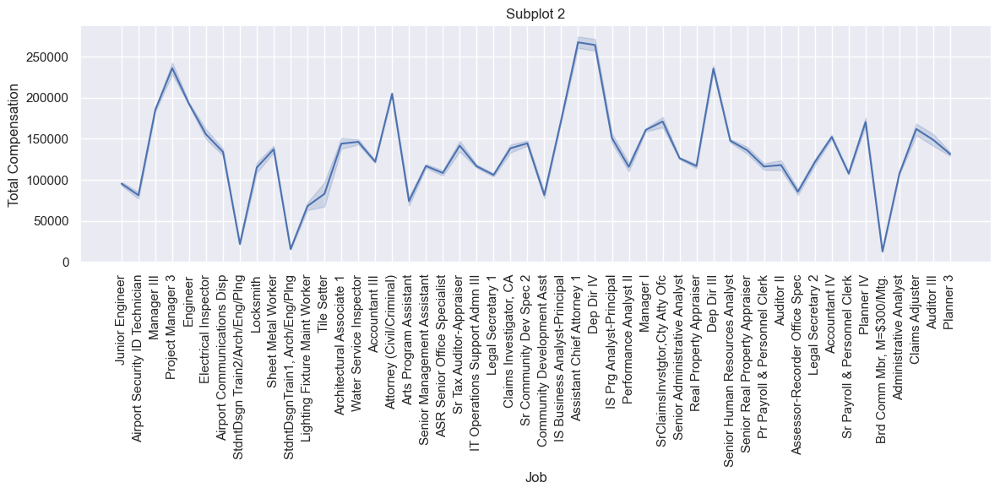

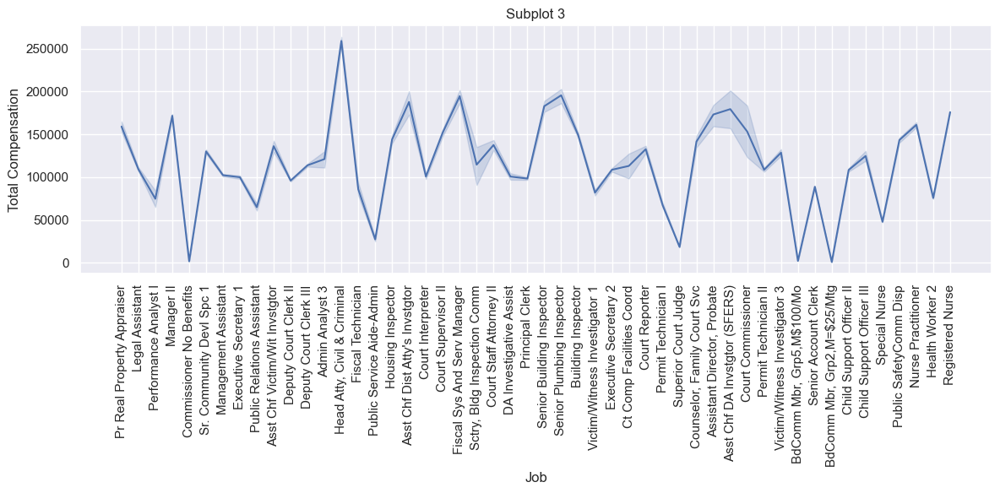

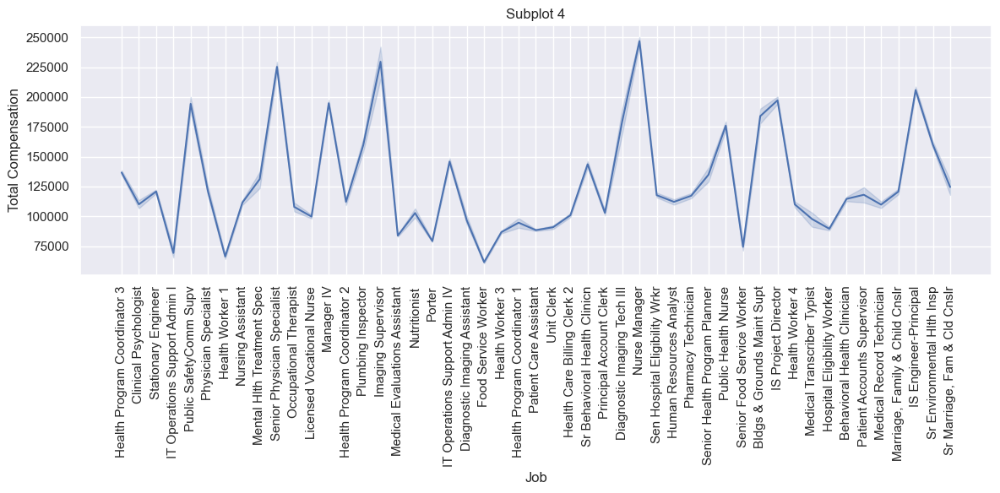

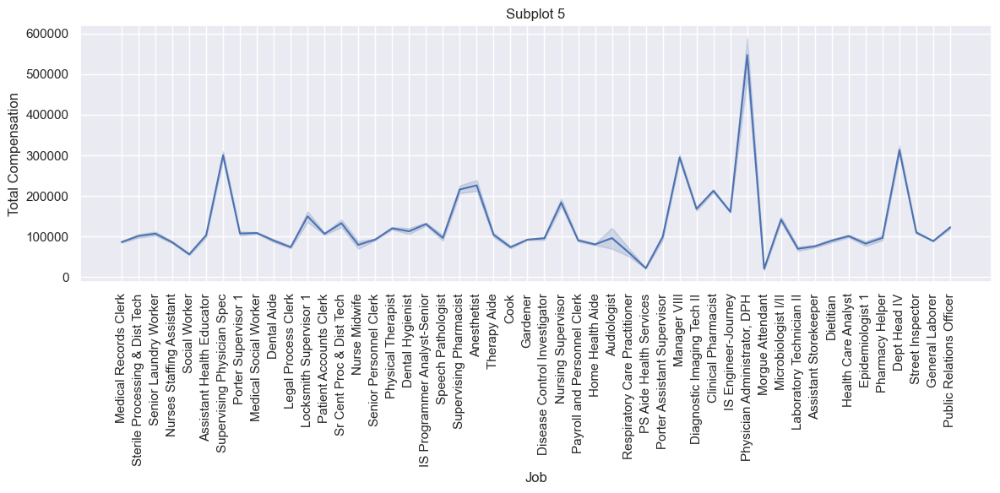

...

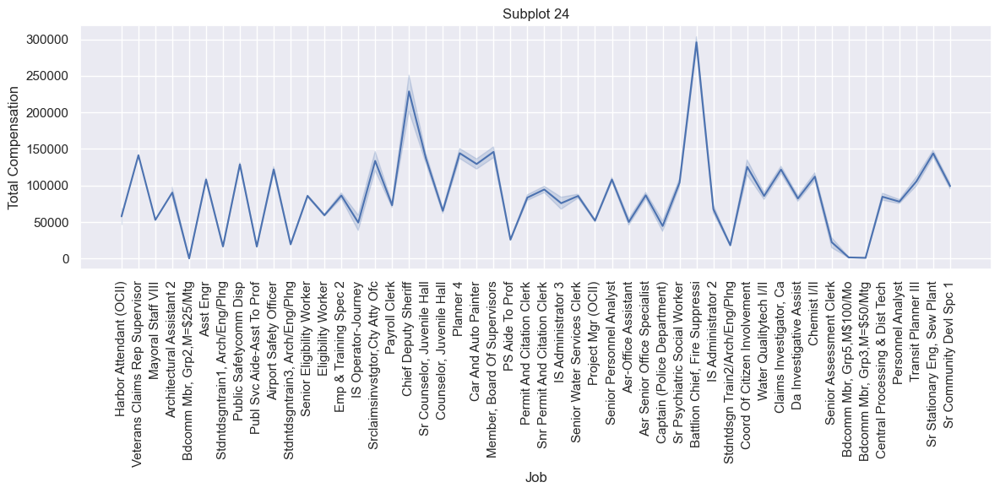

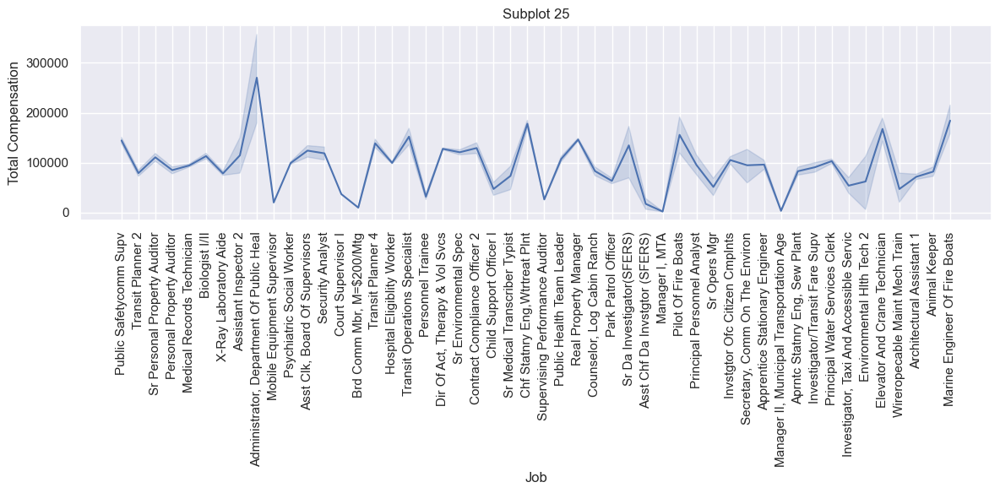

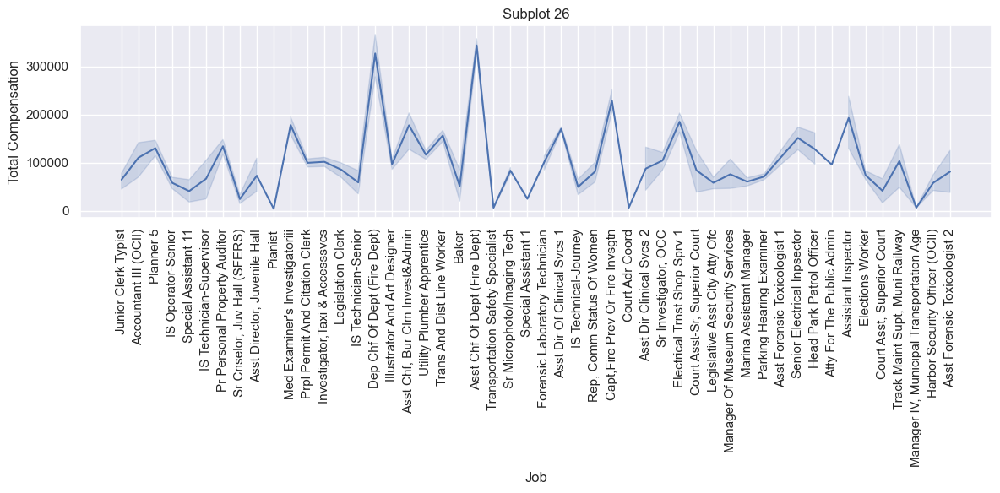

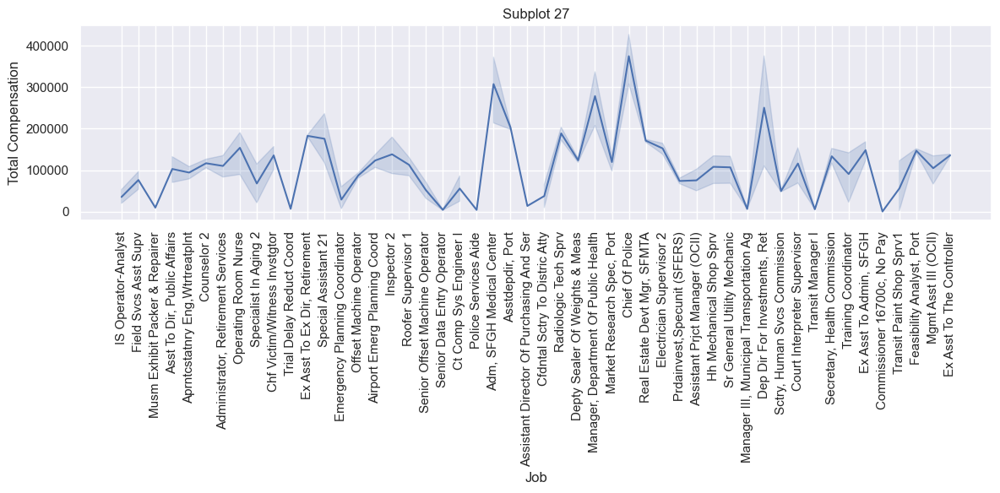

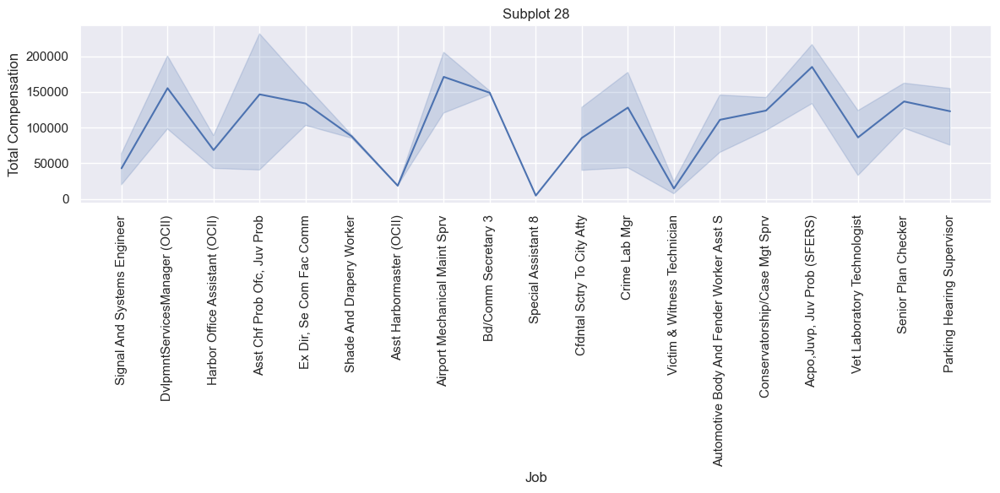

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming you have a DataFrame named 'df' with columns 'Job' and 'total_compensation'

# Set the style of the plots
sns.set(style="darkgrid")

# Get the unique job values
unique_jobs = df['Job'].unique()

# Calculate the number of subplots needed
num_subplots = len(unique_jobs) // 50 + 1

# Divide the unique jobs into groups of 100
job_groups = [unique_jobs[i:i+50] for i in range(0, len(unique_jobs), 50)]

# Loop through each group of jobs and create the subplots
for i, jobs in enumerate(job_groups):
    # Filter the data for the current group of jobs
    df_group = df[df['Job'].isin(jobs)]
    
    # Create a new figure and subplot
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Plot the line graph for the current group of jobs
    sns.lineplot(x='Job', y='Total Compensation', data=df_group, ax=ax)
    
    # Set the labels and title for the current subplot
    ax.set_xlabel('Job')
    ax.set_ylabel('Total Compensation')
    ax.set_title(f'Subplot {i+1}')
    
    # Rotate the x-axis labels if needed
    ax.tick_params(axis='x', rotation=90)
    
    # Adjust the spacing between subplots
    plt.tight_layout()
    
    # Show the plot
    plt.show()


# Level 2 Analysis --Numerical Analysis

In [135]:
numeric1.columns

Index(['Organization Group Code', 'Year', 'Union Code', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation'],
      dtype='object')

## 1. Analysis of Organization Group Code and Total compensation

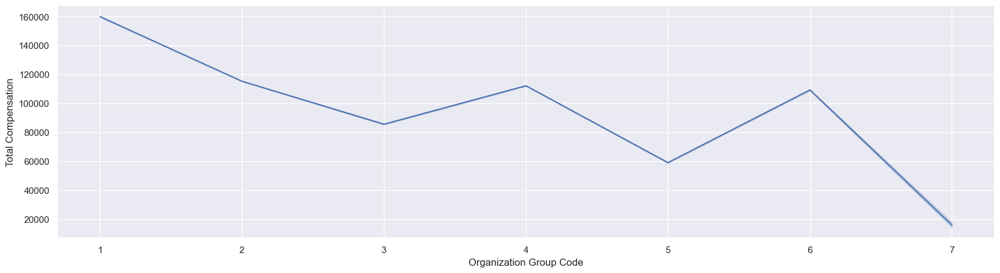

In [136]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Organization Group Code',y='Total Compensation',data=df)
# ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

## 2.Analysis of Year and Total compensation

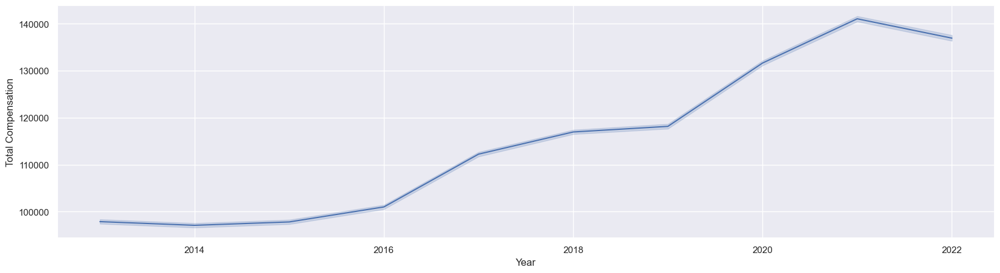

In [137]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Year',y='Total Compensation',data=df)
# ax.set_xticklabels(df['Year']);
# ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

## 3. Analysis of Union Code and Total compensation

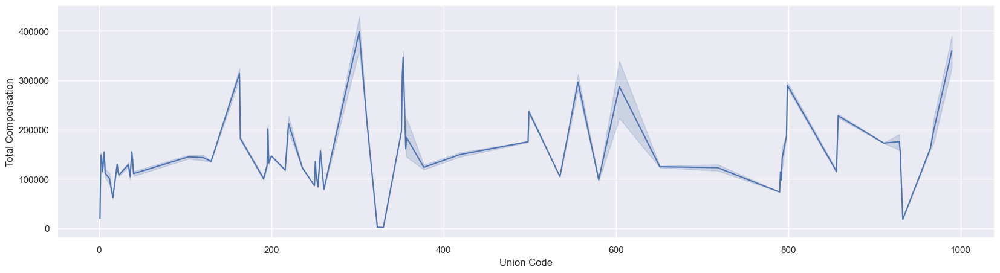

In [138]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax= sns.lineplot(x = 'Union Code',y='Total Compensation',data=df)

# ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

## 4. Analysis of Salaries and total compensation 

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\1459879802.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


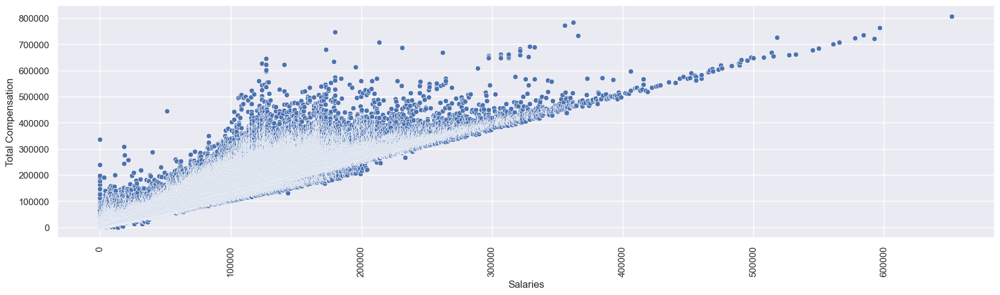

In [139]:
df_sorted = df.sort_values('Salaries')
fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Salaries', y='Total Compensation', data=df_sorted)

ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

## 5. Analysis of Overtime and Total Compensation

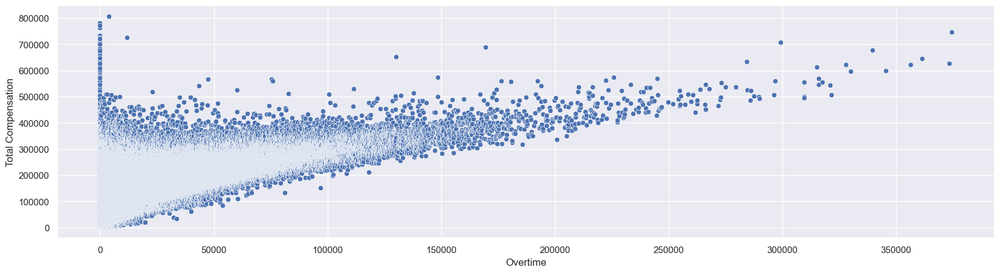

In [140]:
df_sorted = df.sort_values('Overtime')

fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Overtime', y='Total Compensation', data=df_sorted)

## 6. Analysis of Other Salaries and Total Compensation

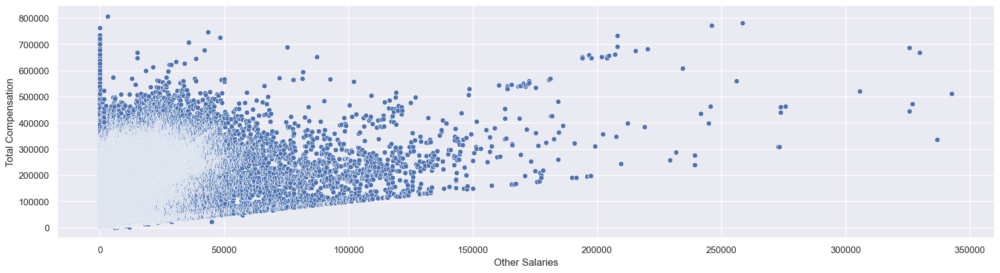

In [141]:
df_sorted = df.sort_values('Other Salaries')

fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Other Salaries', y='Total Compensation', data=df_sorted)

## 7. Analysis of Total Salary and Total Compensation 

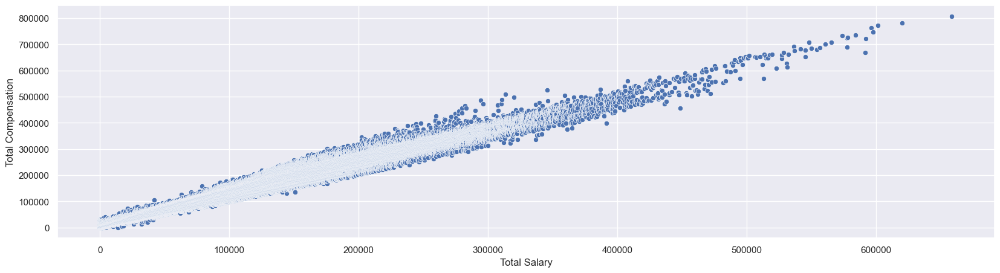

In [142]:
df_sorted = df.sort_values('Total Salary')

fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Total Salary', y='Total Compensation', data=df_sorted)

## 8. Analysis of Retirement and Total Compensation 

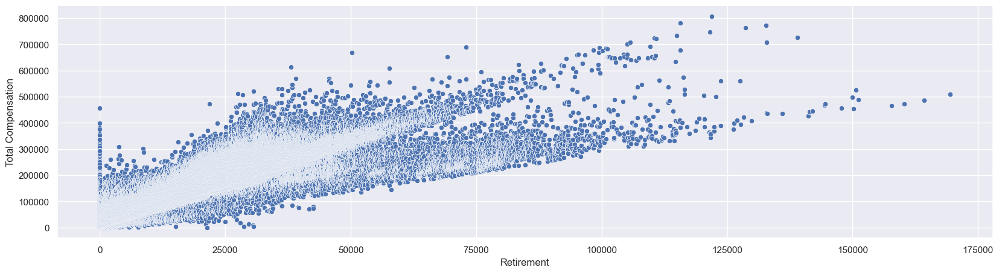

In [143]:
df_sorted = df.sort_values('Retirement')

fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Retirement', y='Total Compensation', data=df_sorted)

## 9. Analysis of Health and Dental and Total Compensation

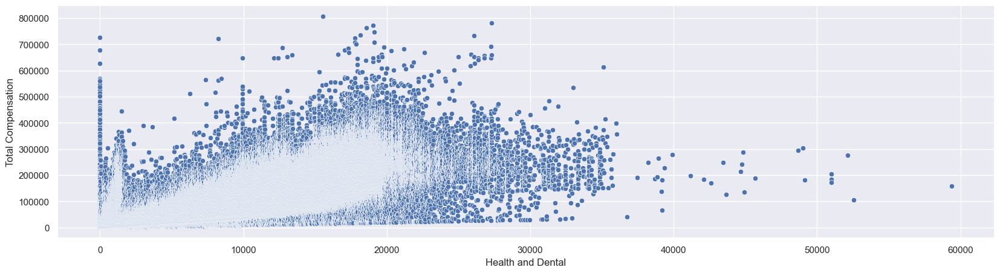

In [144]:
df_sorted = df.sort_values('Health and Dental')

fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Health and Dental', y='Total Compensation', data=df_sorted)

## 10. Analysis of Other Benefits and Total compensation 

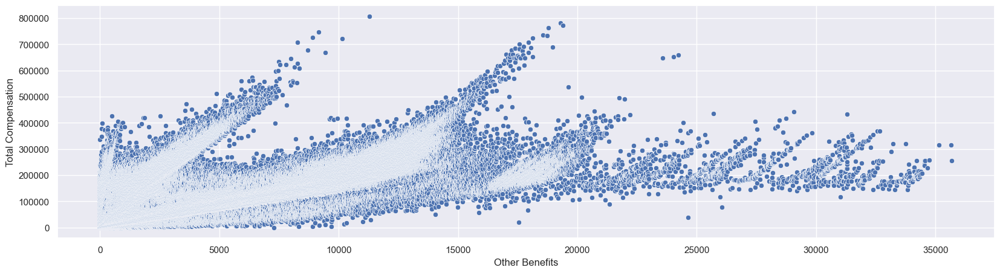

In [145]:
df_sorted = df.sort_values('Other Benefits')

fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Other Benefits', y='Total Compensation', data=df_sorted)

## 11. Analysis of Total Benefits and Total Compensation 

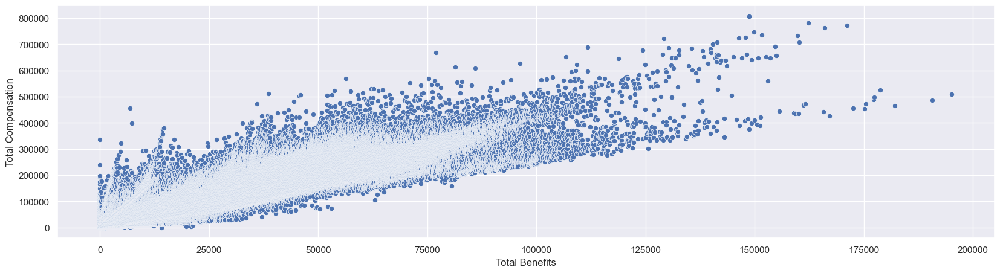

In [147]:
df_sorted = df.sort_values('Total Benefits')
# df_sorted.columns
fig, ax = plt.subplots(figsize=(20, 5))
ax = sns.scatterplot(x='Total Benefits', y='Total Compensation', data=df_sorted)

# Level 3 analysis 

## 1. Identify the top-paying departments in terms of average total compensation and determine the factors contributing to their higher compensation levels.

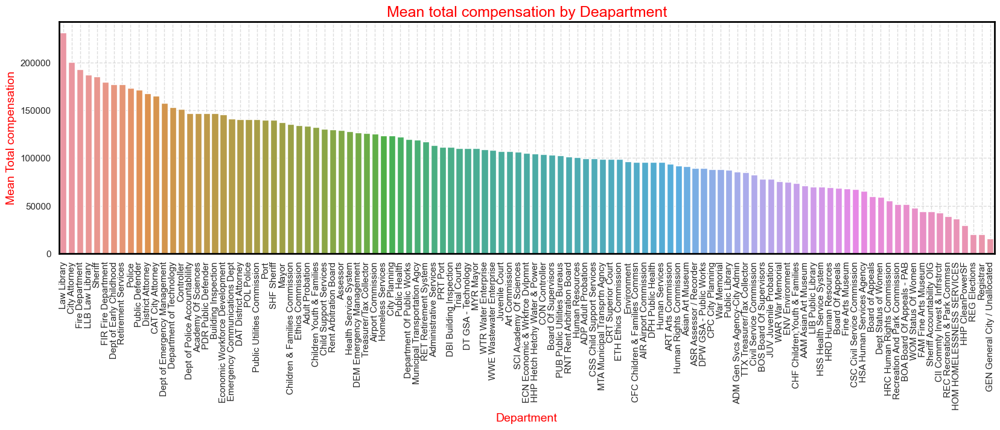

In [442]:
department_mean = df.groupby('Department')['Total Compensation'].mean().reset_index()
department_mean = department_mean.sort_values('Total Compensation',ascending=False)


fig,ax = plt.subplots(figsize=(20,5))

ax = sns.barplot(x='Department',y='Total Compensation',data=department_mean)

ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

plt.xlabel('Department',fontsize=14,color='red')
plt.ylabel('Mean Total compensation',fontsize=14,color='red')
plt.title('Mean total compensation by Deapartment',fontsize=18,color='red')
plt.grid(linestyle='--', alpha=0.7)

for spine in plt.gca().spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')
    
plt.show()


In [149]:

department_mean1 = df.groupby('Department')['Total Compensation'].mean().reset_index()
top_department = department_mean.sort_values('Total Compensation',ascending=False)[:5]
top_department

,Department,Total Compensation
76,Law Library,231382.226250
31,City Attorney,200371.187450
58,Fire Department,192875.640034
75,LLB Law Library,187457.892778
101,Sheriff,185458.324684


In [150]:
top_department_data = df[df['Department'].isin(top_department['Department'])].groupby('Department').agg({'Total Salary':'mean','Total Benefits':'mean'}).reset_index()
top_department_data


,Department,Total Salary,Total Benefits
0,City Attorney,149226.492899,51144.694551
1,Fire Department,152635.070218,40240.569816
2,LLB Law Library,127545.697222,59912.195556
3,Law Library,166233.643333,65148.582917
4,Sheriff,134992.022674,50466.316596


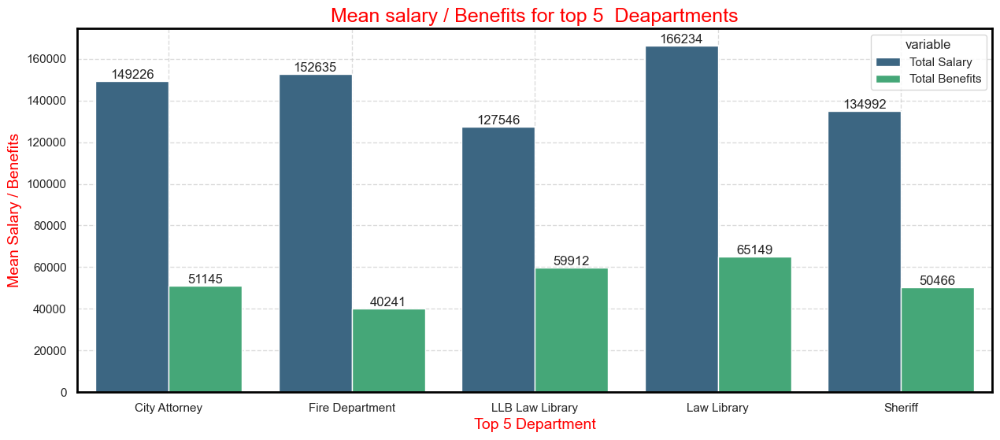

In [253]:
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='Department', y='value', hue='variable', data=pd.melt(top_department_data, id_vars='Department'), palette='viridis')
plt.xlabel('Top 5 Department',fontsize=14,color='red')
plt.ylabel('Mean Salary / Benefits',fontsize=14,color='red')
plt.title('Mean salary / Benefits for top 5  Deapartments',fontsize=18,color='red')
plt.grid(linestyle='--', alpha=0.7)

for spine in plt.gca().spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')
    
barcount(ax)

In [152]:
print('Department Total salary mean: ',df['Total Salary'].mean())
print('Deaprtment Total Benifits mean: ',df['Total Benefits'].mean())

Department Total salary mean:  84422.9065429722
Deaprtment Total Benifits mean:  30505.340980503923


**Top 5 departments mean total salary and total benefits are more than the mean salary of all departments**

## 2. Investigate the trends in employee compensation over the years, comparing fiscal and calendar years,and identify any significant changes or patterns.

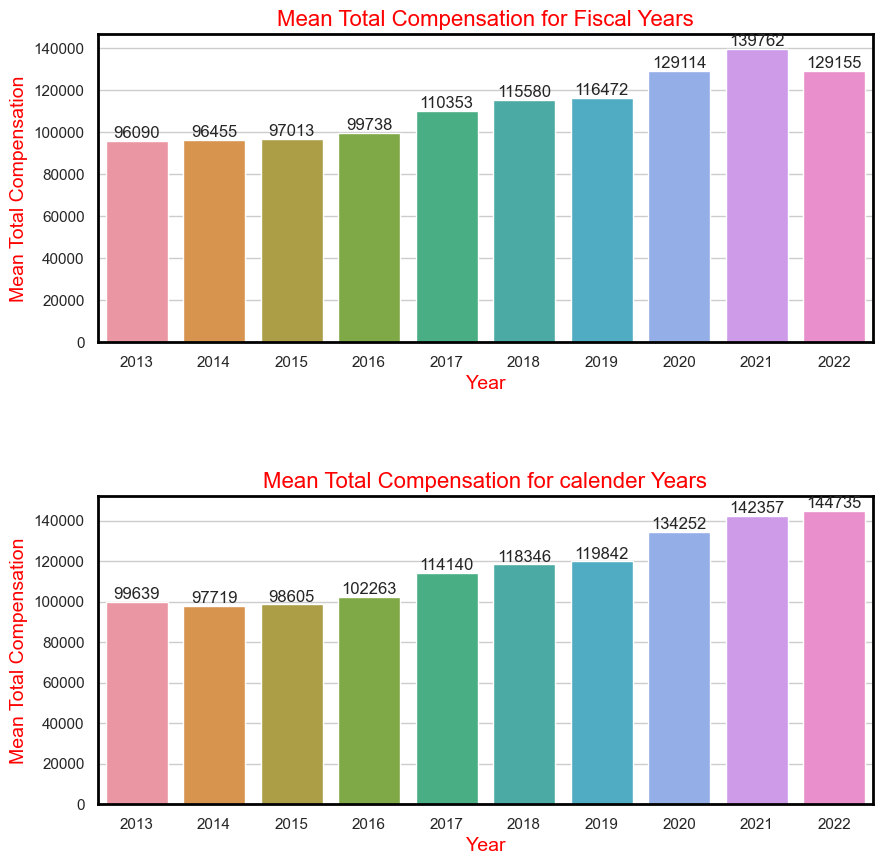

In [263]:
df_fiscal = df[df['Year Type'] == 'Fiscal']
df_calendar = df[df['Year Type'] == 'Calendar']
fiscal_mean = df_fiscal.groupby('Year')['Total Compensation'].mean()
calendar_mean = df_calendar.groupby('Year')['Total Compensation'].mean()

fig, ax = plt.subplots(2, 1, figsize=(10, 10))

sns.barplot(x=fiscal_mean.index, y=fiscal_mean.values, label='Fiscal Year', ax=ax[0])
ax[0].set_xlabel('Year', fontsize=14,color='red')
ax[0].set_ylabel('Mean Total Compensation', fontsize=14,color='red')
ax[0].set_title('Mean Total Compensation for Fiscal Years', fontsize=16,color='red')
for spine in ax[0].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')
    
sns.barplot(x=calendar_mean.index, y=calendar_mean.values, label='Calendar Year', ax=ax[1])

ax[1].set_xlabel('Year', fontsize=14,color='red')
ax[1].set_ylabel('Mean Total Compensation', fontsize=14,color='red')
ax[1].set_title('Mean Total Compensation for calender Years', fontsize=16,color='red')
for spine in ax[1].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')
 
plt.subplots_adjust(hspace=0.5)

barcount(ax[0])
barcount(ax[1])



**Employee compensation gradually increased over the years but there is no significant difference between fiscal and calender year**

## 3. Analyze the distribution of salaries and benefits to understand the overall compensation structure in San Francisco. Identify any outliers or anomalies in the data.

In [154]:
df[['Total Salary','Total Benefits']].describe().T

,count,mean,std,min,25%,50%,75%,max
Total Salary,840323.0,84422.906543,58946.842579,0.0,38079.99,80170.51,119839.15,658867.57
Total Benefits,840323.0,30505.340981,19056.194771,0.0,13982.98,33853.02,42975.69,195219.62


In [308]:
df.columns

Index(['Organization Group Code', 'Job Family Code', 'Job Code', 'Year Type',
       'Year', 'Organization Group', 'Department Code', 'Department',
       'Union Code', 'Union', 'Job Family', 'Job', 'Employee Identifier',
       'Salaries', 'Overtime', 'Other Salaries', 'Total Salary', 'Retirement',
       'Health and Dental', 'Other Benefits', 'Total Benefits',
       'Total Compensation', 'Benefit Ratio', 'YOS', 'Retirement_Ratio',
       'Health_Dental_Ratio'],
      dtype='object')

In [ ]:
Min = df['Total Salary'].min()
Max = df['Total Salary'].max()


q1 = df['Total Salary'].quantile(0.25)
q3 = df['Total Salary'].quantile(0.75)


IQR = q3-q1


UF = q3 +1.5*IQR
LF = q1-1.5*IQR

dc = df[(df['Total Salary'] >LF) & (df['Total Salary'] <UF) ]

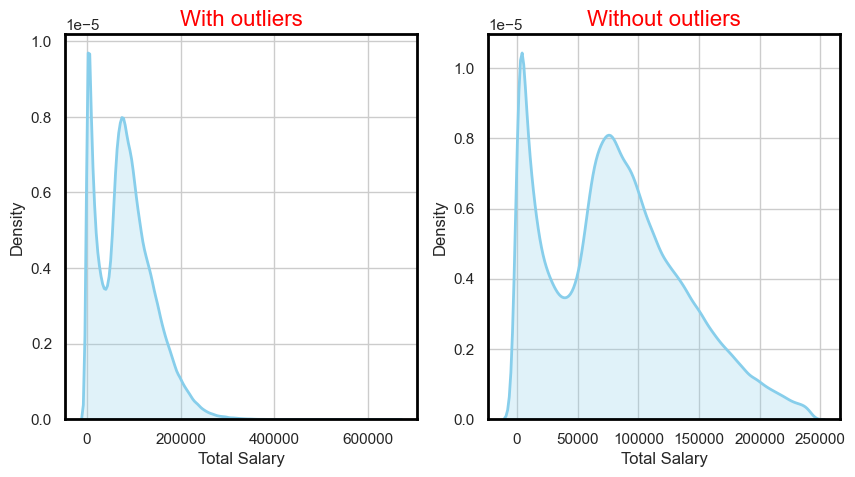

In [272]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

sns.kdeplot(data=df, x='Total Salary', fill=True, color='skyblue', linewidth=2,ax=ax[0])

ax[0].set_title('With outliers', fontsize=16,color='red')
for spine in ax[0].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')
    
sns.kdeplot(data=dc, x='Total Salary', fill=True, color='skyblue', linewidth=2,ax=ax[1])
ax[1].set_title('Without outliers', fontsize=16,color='red')
for spine in ax[1].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

<Axes: >

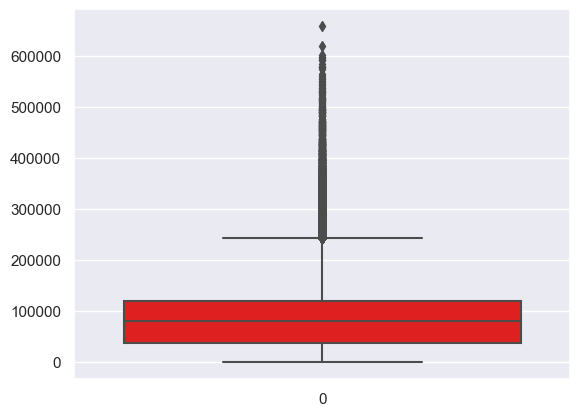

In [156]:

sns.boxplot(df['Total Salary'],color='red')


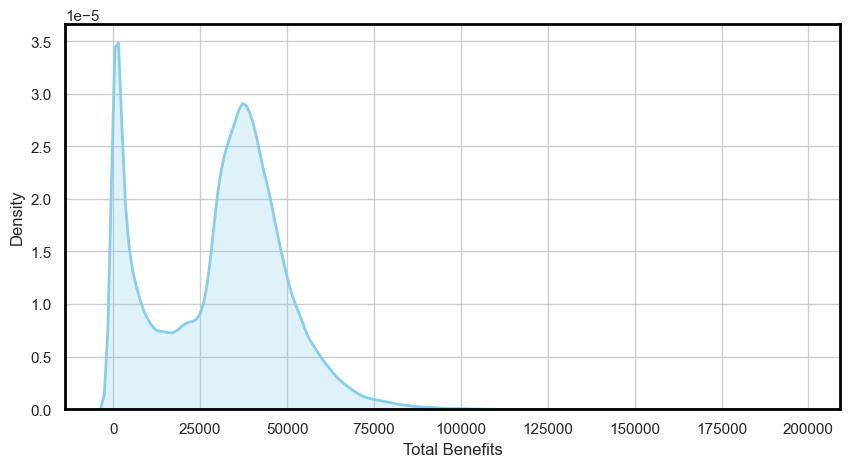

In [276]:
fig, ax = plt.subplots( figsize=(10,5))

sns.kdeplot(data=df, x='Total Benefits', fill=True, color='skyblue', linewidth=2)


for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')
    
# sns.kdeplot(data=dc, x='Total Benefits', fill=True, color='skyblue', linewidth=2,ax=ax[1])
# ax[1].set_title('Without outliers', fontsize=16,color='red')
# for spine in ax[1].spines.values():
#     spine.set_linewidth(2)
#     spine.set_edgecolor('black')

<Axes: >

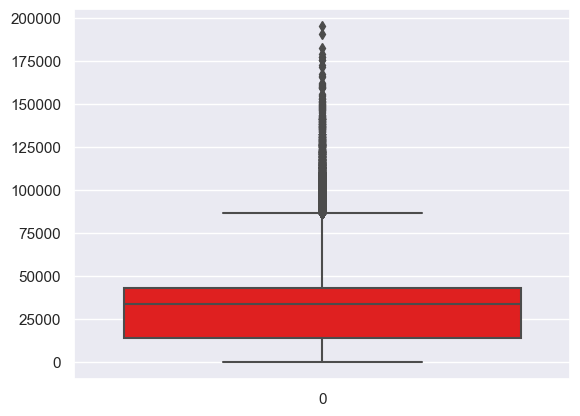

In [157]:

sns.boxplot(df['Total Benefits'],color='red')

## 4. Examine the relationship between salaries, overtime, and other forms of compensation to determine if certain job families or departments have higher instances of overtime or irregular payments.

In [1]:
fig,ax = plt.subplots(1,2,figsize=(12,5))

grouped_data1 = df.groupby('Department')['Total Compensation'].mean().reset_index()
grouped_data1 = grouped_data1.sort_values('Total Compensation',ascending=False)[:5]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x='Department', y='Total Compensation', data=grouped_data1,ax=ax[0])

ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90);
ax[0].set_title('Top 5 Departments with Highest Total Compensation', fontsize=14,color='red')
for spine in ax[0].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

grouped_data2 = df.groupby('Department')['Overtime'].mean().reset_index()
grouped_data2 = grouped_data2.sort_values('Overtime',ascending=False)[:5]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x='Department', y='Overtime', data=grouped_data2,ax=ax[1])

ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90);
ax[1].set_title('Top 5 Departments with Highest Overtime', fontsize=14,color='red')
for spine in ax[1].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');




NameError: name 'df' is not defined

**2 Departments Sheriff and Fire department are both in top 5 department which receives highest compensation and overtime**

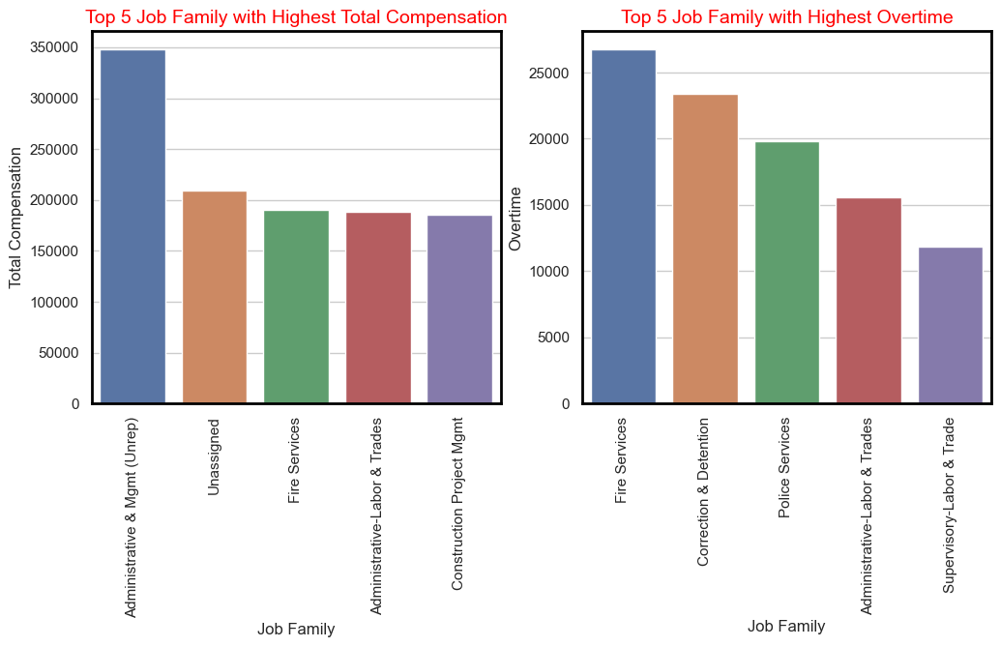

<Figure size 2000x600 with 0 Axes>

<Figure size 2000x600 with 0 Axes>

In [329]:
fig,ax = plt.subplots(1,2,figsize=(12,5))

grouped_data1 = df.groupby('Job Family')['Total Compensation'].mean().reset_index()
grouped_data1 = grouped_data1.sort_values('Total Compensation',ascending=False)[:5]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x='Job Family', y='Total Compensation', data=grouped_data1,ax=ax[0])

ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90);
ax[0].set_title('Top 5 Job Family with Highest Total Compensation', fontsize=14,color='red')
for spine in ax[0].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

grouped_data2 = df.groupby('Job Family')['Overtime'].mean().reset_index()
grouped_data2 = grouped_data2.sort_values('Overtime',ascending=False)[:5]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x='Job Family', y='Overtime', data=grouped_data2,ax=ax[1])

ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90);
ax[1].set_title('Top 5 Job Family with Highest Overtime', fontsize=14,color='red')
for spine in ax[1].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');


**2 Job family Fire services  and Administartive-Labor and trades  are both in top 5 Job family which receives highest compensation and overtime**

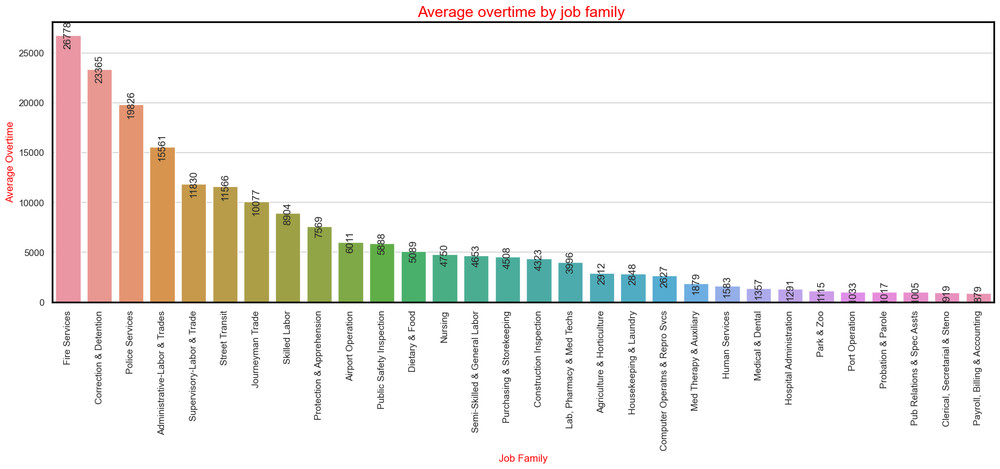

In [336]:
def barcountv(ax):
    for bar in ax.patches:
        percentage = f'{round(bar.get_height())}'
        x = bar.get_x() + bar.get_width() /2
        y = bar.get_height() 
        ax.annotate(percentage, (x, y), va='center', ha='center', rotation='vertical')


grouped_data = df.groupby('Job Family')['Overtime'].mean().reset_index()
grouped_data = grouped_data .sort_values('Overtime',ascending=False)[:30]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
ax = sns.barplot(x='Job Family', y='Overtime', data=grouped_data)
plt.xticks(rotation=90)
plt.xlabel('Job Family',color='red')
plt.ylabel('Average Overtime',color='red')

barcountv(ax)

ax.set_title('Average overtime by job family ', fontsize=18,color='red')
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');
plt.show()


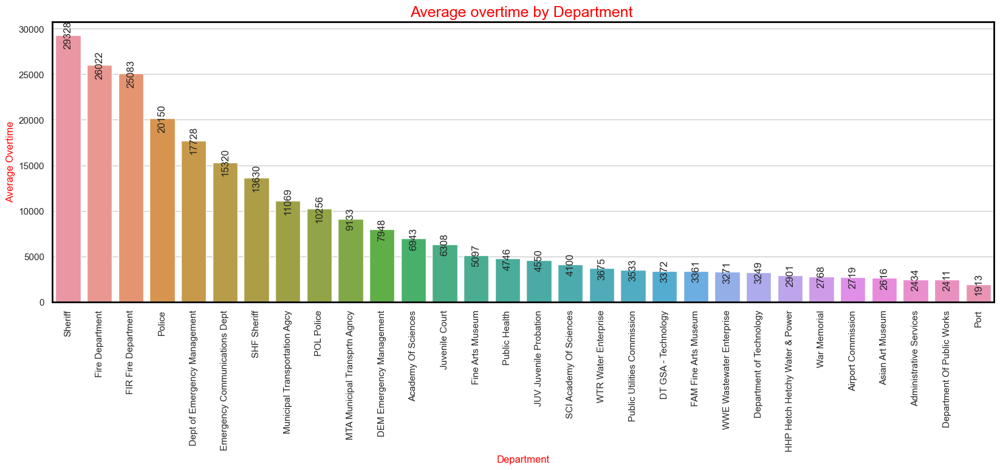

In [337]:
grouped_data = df.groupby('Department')['Overtime'].mean().reset_index()
grouped_data = grouped_data .sort_values('Overtime',ascending=False)[:30]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
ax = sns.barplot(x='Department', y='Overtime', data=grouped_data)
plt.xticks(rotation=90)
plt.xlabel('Department',color='red')
plt.ylabel('Average Overtime',color='red')

ax.set_title('Average overtime by Department ', fontsize=18,color='red')
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');
barcountv(ax)
plt.show()

## 5.  Explore the distribution of benefits across different organization groups and unions to understand the variations in benefit packages provided to employees.

C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\3980361241.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


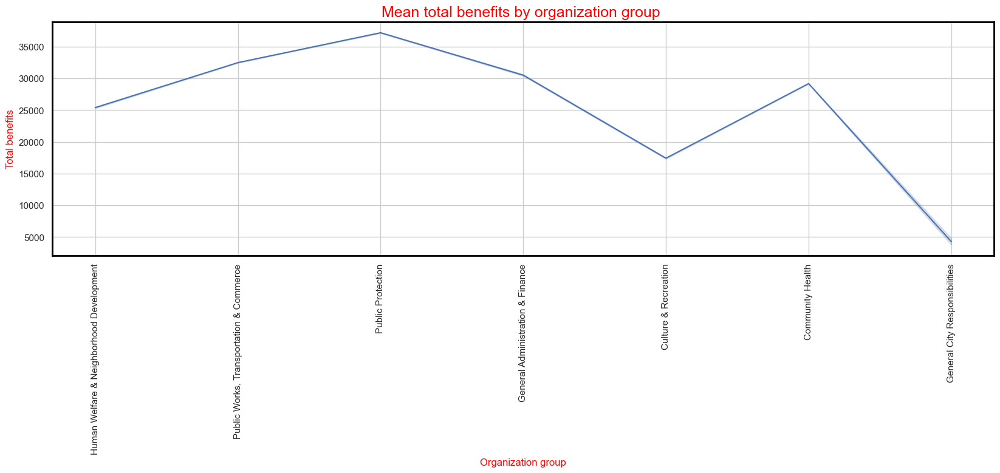

In [338]:
fig,ax = plt.subplots(figsize=(20,5))

sns.set(style="darkgrid")
ax = sns.lineplot(x = 'Organization Group',y='Total Benefits',data=df)

plt.xlabel('Organization group',color='red')
plt.ylabel('Total benefits',color='red')

ax.set_title('Mean total benefits by organization group ', fontsize=18,color='red')
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');

ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\500770689.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90);


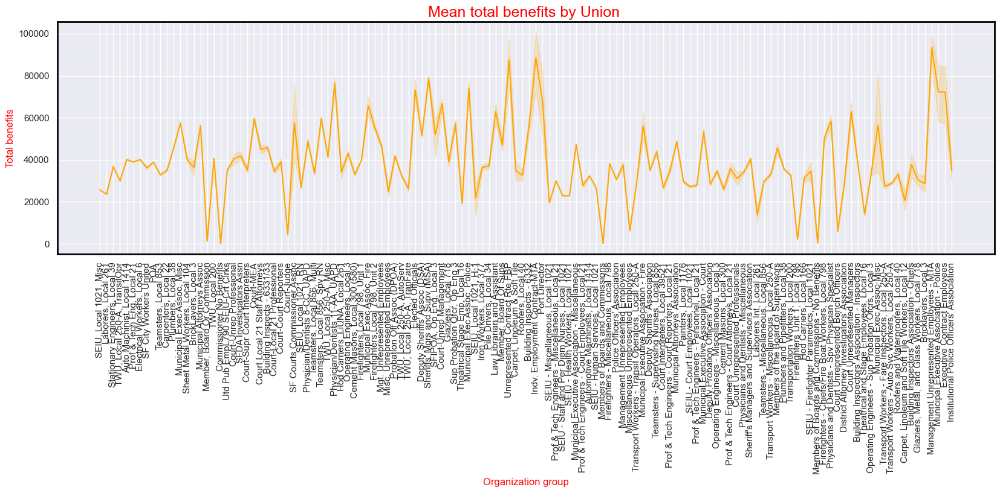

In [339]:
fig,ax = plt.subplots(figsize=(20,5))

sns.lineplot(x = 'Union',y='Total Benefits',data=df,color='orange')

plt.xlabel('Organization group',color='red')
plt.ylabel('Total benefits',color='red')

ax.set_title('Mean total benefits by Union ', fontsize=18,color='red')
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');

ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

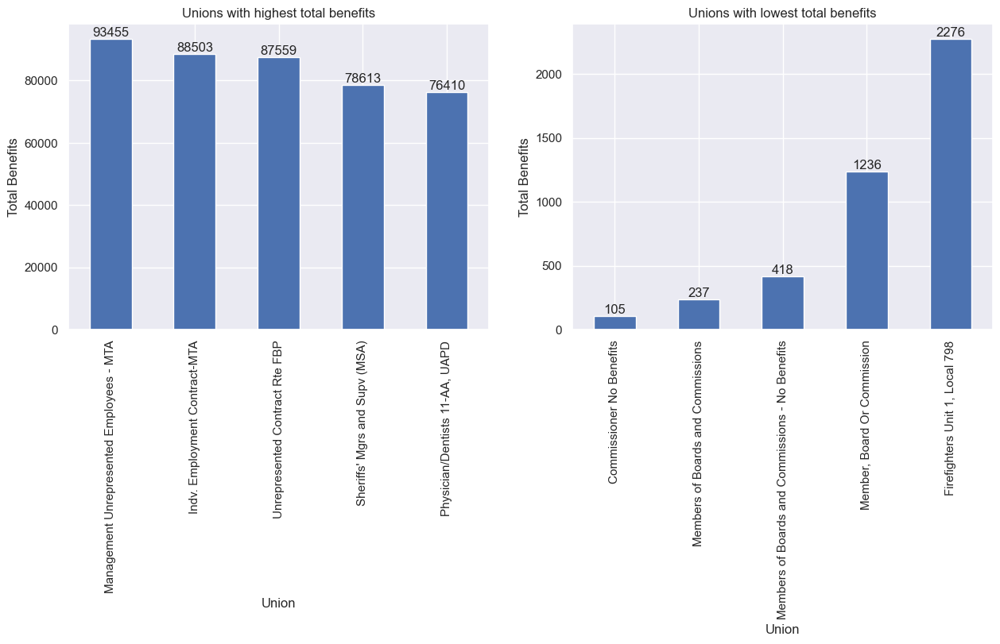

In [162]:
fig,ax = plt.subplots(1,2,figsize=(15,5))

df.groupby('Union')['Total Benefits'].mean().sort_values(ascending=False)[:5].plot(kind='bar',ylabel='Total Benefits',ax=ax[0],title='Unions with highest total benefits')
df.groupby('Union')['Total Benefits'].mean().sort_values()[:5].plot(kind='bar',ylabel='Total Benefits',ax=ax[1],title='Unions with lowest total benefits')
barcount(ax[0])
barcount(ax[1])


## 6. Investigate the impact of job family on compensation levels and identify the job families with the highest and lowest average total compensation.

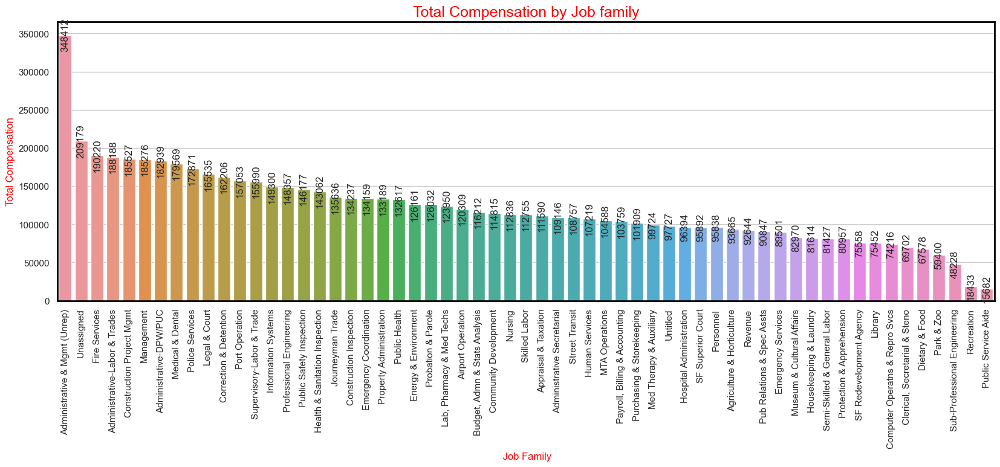

In [346]:
grouped_data = df.groupby('Job Family')['Total Compensation'].mean().reset_index()
sorted_data = grouped_data.sort_values('Total Compensation', ascending=False)

sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
ax = sns.barplot(x = 'Job Family',y='Total Compensation',data=sorted_data)

plt.xlabel(' Job Family',color='red')
plt.ylabel('Total Compensation',color='red')

ax.set_title('Total Compensation by Job family', fontsize=18,color='red')
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');


plt.xticks(rotation=90);
barcountv(ax)


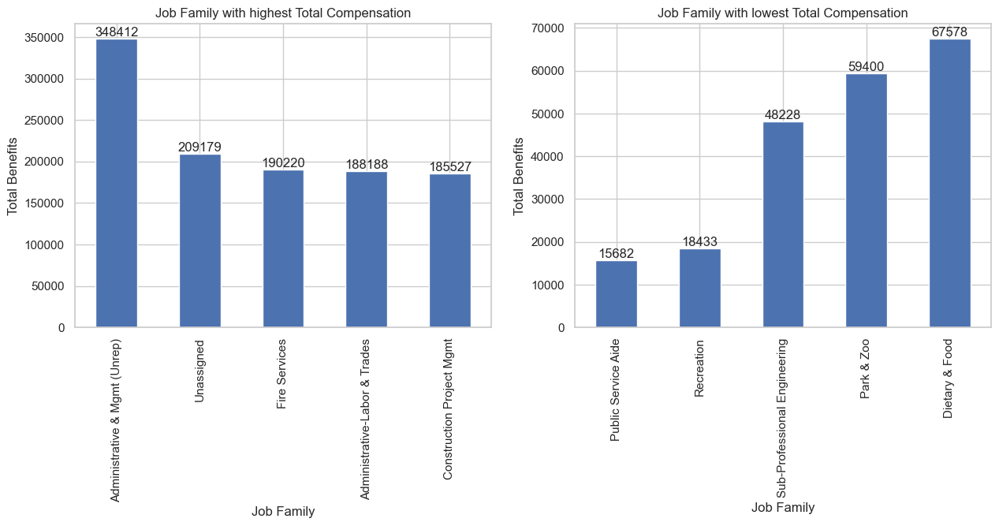

In [164]:
fig,ax = plt.subplots(1,2,figsize=(15,5))

df.groupby('Job Family')['Total Compensation'].mean().sort_values(ascending=False)[:5].plot(kind='bar',ylabel='Total Benefits',ax=ax[0],title='Job Family with highest Total Compensation')
df.groupby('Job Family')['Total Compensation'].mean().sort_values()[:5].plot(kind='bar',ylabel='Total Benefits',ax=ax[1],title='Job Family with lowest Total Compensation')
barcount(ax[0])
barcount(ax[1])

In [165]:
print('Job Family with highest avg. total compensation: \n',sorted_data.iloc[0])
print('Job Family with lowest avg. total compensation: \n',sorted_data.iloc[-1])


Job Family with highest avg. total compensation: 
 Job Family            Administrative & Mgmt (Unrep)
Total Compensation                    348412.009634
Name: 0, dtype: object
Job Family with lowest avg. total compensation: 
 Job Family            Public Service Aide
Total Compensation            15682.00074
Name: 46, dtype: object


## 7. Analyze the proportion of benefits in total compensation and assess how it varies across different departments and job families.

Text(0.5, 1.0, 'Proportion of Benefits in Total Compensation by Department')

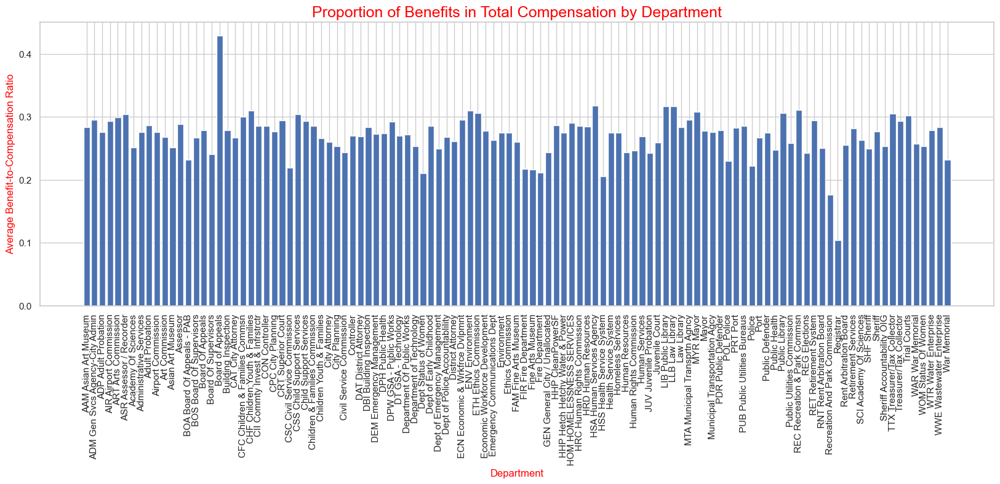

In [351]:
df['Benefit Ratio'] = df['Total Benefits'] / df['Total Compensation']


department_grouped = df.groupby('Department')['Benefit Ratio'].mean().reset_index()

job_family_grouped = df.groupby('Job Family')['Benefit Ratio'].mean().reset_index()

# Create bar plots using matplotlib
plt.figure(figsize=(20, 6))

plt.bar(department_grouped['Department'], department_grouped['Benefit Ratio'])
plt.xticks(rotation=90)
plt.xlabel('Department',color='red')
plt.ylabel('Average Benefit-to-Compensation Ratio',color='red')
plt.title('Proportion of Benefits in Total Compensation by Department',color='red',fontsize=18)


<Axes: title={'center': 'Department with lowest Benefit Ratio'}, xlabel='Department', ylabel='Benefit Ratio'>

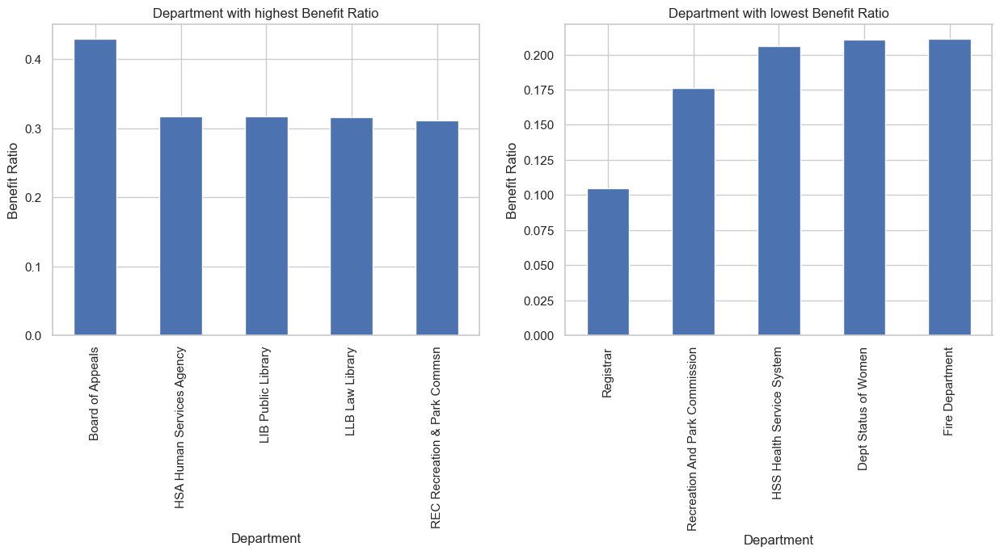

In [167]:
fig,ax = plt.subplots(1,2,figsize=(15,5))

df.groupby('Department')['Benefit Ratio'].mean().sort_values(ascending=False)[:5].plot(kind='bar',ylabel='Benefit Ratio',ax=ax[0],title='Department with highest Benefit Ratio')
df.groupby('Department')['Benefit Ratio'].mean().sort_values()[:5].plot(kind='bar',ylabel='Benefit Ratio',ax=ax[1],title='Department with lowest Benefit Ratio')


Text(0.5, 1.0, 'Proportion of Benefits in Total Compensation by Job Family')

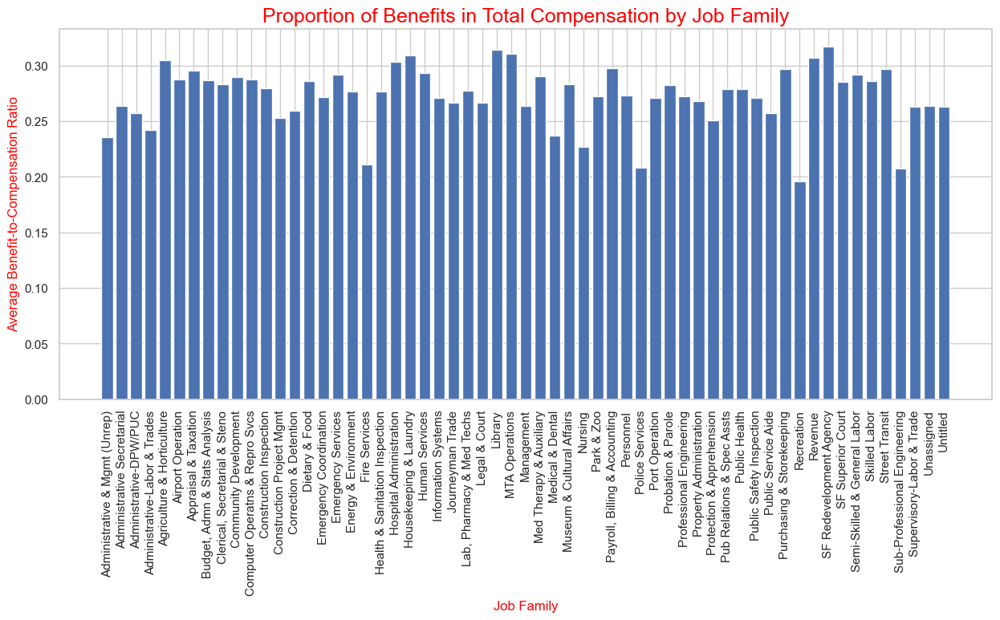

In [353]:
plt.figure(figsize=(15, 6))
plt.bar(job_family_grouped['Job Family'], job_family_grouped['Benefit Ratio'])
plt.xticks(rotation=90)
plt.xlabel('Job Family',color='red')
plt.ylabel('Average Benefit-to-Compensation Ratio',color='red')
plt.title('Proportion of Benefits in Total Compensation by Job Family',color='red',fontsize=18)

<Axes: title={'center': 'Job Family with lowest Benefit Ratio'}, xlabel='Job Family', ylabel='Benefit Ratio'>

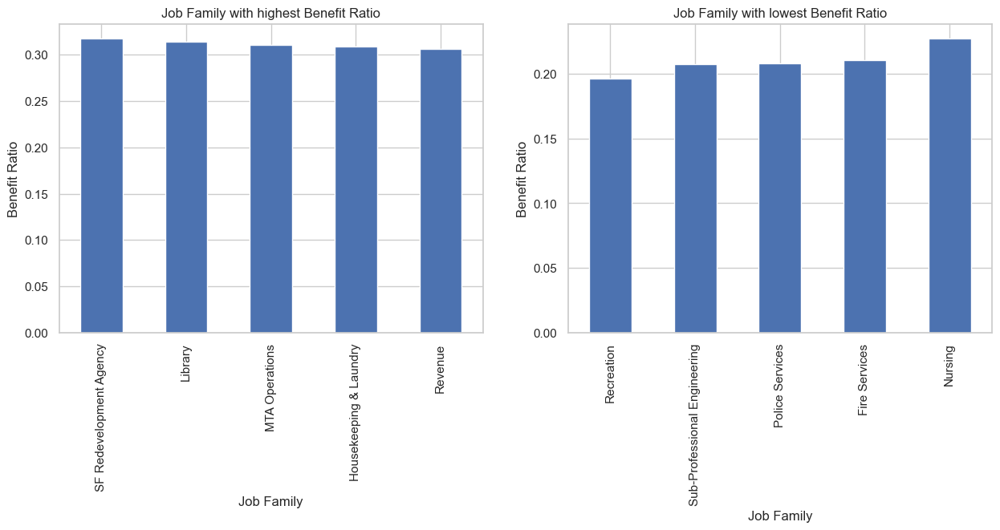

In [169]:
fig,ax = plt.subplots(1,2,figsize=(15,5))

df.groupby('Job Family')['Benefit Ratio'].mean().sort_values(ascending=False)[:5].plot(kind='bar',ylabel='Benefit Ratio',ax=ax[0],title='Job Family with highest Benefit Ratio')
df.groupby('Job Family')['Benefit Ratio'].mean().sort_values()[:5].plot(kind='bar',ylabel='Benefit Ratio',ax=ax[1],title='Job Family with lowest Benefit Ratio')


## 8. Identify any correlations between employee compensation and factors such as years of service, job level, or union affiliation.

In [170]:
df['Employee Identifier'].value_counts()

Employee Identifier
0           49
43227       22
7041        21
19638       20
30585       19
            ..
52807051     1
50851013     1
51666710     1
51666740     1
40801985     1
Name: count, Length: 470990, dtype: int64

In [344]:
g1 = df.groupby('Employee Identifier')['Year'].min()
g2 = df.groupby('Employee Identifier')['Year'].max()
y = g2-g1+1
y.value_counts()


Year
1    380243
2     51339
4     30294
3      9017
5        65
6        32
Name: count, dtype: int64

In [348]:
df[df['Employee Identifier']==0]['Year']


4868      2019
18455     2018
29711     2022
39283     2019
46669     2017
52631     2020
63326     2018
76411     2017
77991     2017
107109    2017
108322    2017
116300    2021
130498    2019
203563    2017
205012    2017
207116    2020
211024    2020
225650    2019
247505    2021
252233    2022
255870    2018
284675    2018
285861    2018
300351    2017
301955    2020
306029    2021
316134    2018
329496    2017
332534    2018
332658    2018
354862    2019
361527    2017
391479    2017
394418    2017
410801    2018
423007    2017
423645    2017
430920    2020
435798    2021
441507    2018
441561    2018
452501    2017
455444    2017
457839    2018
473146    2018
474648    2018
475834    2018
486669    2017
490112    2020
Name: Year, dtype: int64

In [ ]:
# import numpy as np
# df2 = df
# df2['YOE'] = np.nan

# for i in range(len(df2)):
#     for j in y.index:
#         if df2.loc[i,'Employee Identifier']== j:
#             pass
#             # df2.loc[i,'YOE'] = y[j]

In [172]:
df2 = df
df2['YOS'] = df2['Employee Identifier'].map(y)


,Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,...,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation,Benefit Ratio,YOS
0,3,1400,1404,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,790.0,"SEIU, Local 1021, Misc",...,0.00,0.00,60720.01,13653.20,14733.76,4904.34,33291.30,94011.31,0.354120,2
1,3,9700,9703,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,0.00,0.00,91677.00,17524.20,14733.76,7411.13,39669.09,131346.09,0.302020,2
2,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,0.00,1540.00,90646.03,17327.20,14733.76,7401.92,39462.88,130108.91,0.303307,2
3,3,2900,2918,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,3355.94,337.75,89274.80,16359.16,14151.56,7096.21,37606.93,126881.73,0.296394,2
4,3,2900,2905,Fiscal,2019,Human Welfare & Neighborhood Development,HSA,Human Services,535.0,"SEIU, Local 1021, Misc",...,0.00,2090.00,88547.00,16925.97,14733.76,7257.89,38917.62,127464.62,0.305321,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
840500,2,7300,7345,Fiscal,2014,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,5158.03,1740.00,100147.39,20251.75,12512.55,8233.87,40998.17,141145.56,0.290467,4
840501,2,7300,7345,Fiscal,2013,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,955.10,1860.00,94153.16,16971.40,12801.79,7872.93,37646.12,131799.28,0.285632,4
840502,2,7300,7345,Calendar,2016,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,0.00,2133.90,2133.90,0.00,98.16,163.24,261.40,2395.30,0.109130,4
840503,2,7300,7345,Calendar,2015,"Public Works, Transportation & Commerce",AIR,AIR Airport Commission,6.0,"Electrical Workers, Local 6",...,593.51,1869.00,96042.51,19749.36,11946.64,7900.63,39596.63,135639.14,0.291926,4


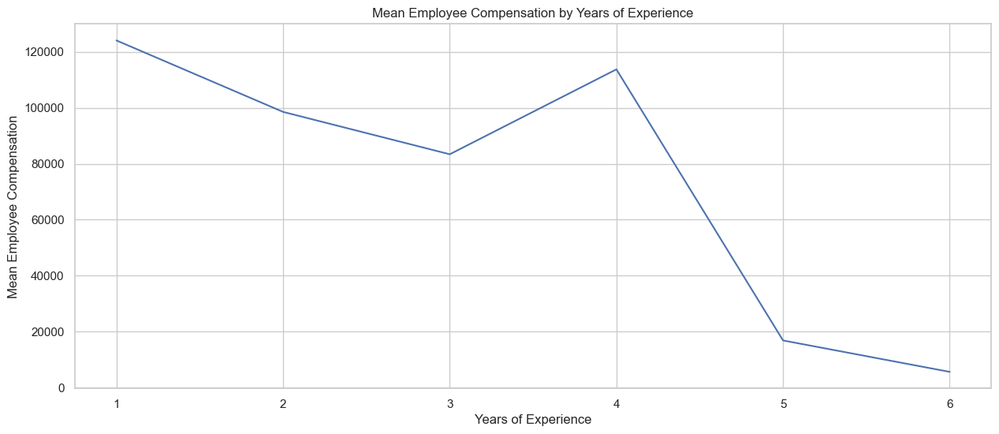

In [173]:
# YOS to employee compensation 
mean_salary = df2.groupby('YOS')['Total Compensation'].mean().reset_index()
plt.figure(figsize=(15, 6))
sns.lineplot(x='YOS', y='Total Compensation', data=mean_salary)
plt.xlabel('Years of Experience')
plt.ylabel('Mean Employee Compensation')
plt.title('Mean Employee Compensation by Years of Experience')
plt.grid(True)


C:\Users\aksha\AppData\Local\Temp\ipykernel_9392\1120696784.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize=8);


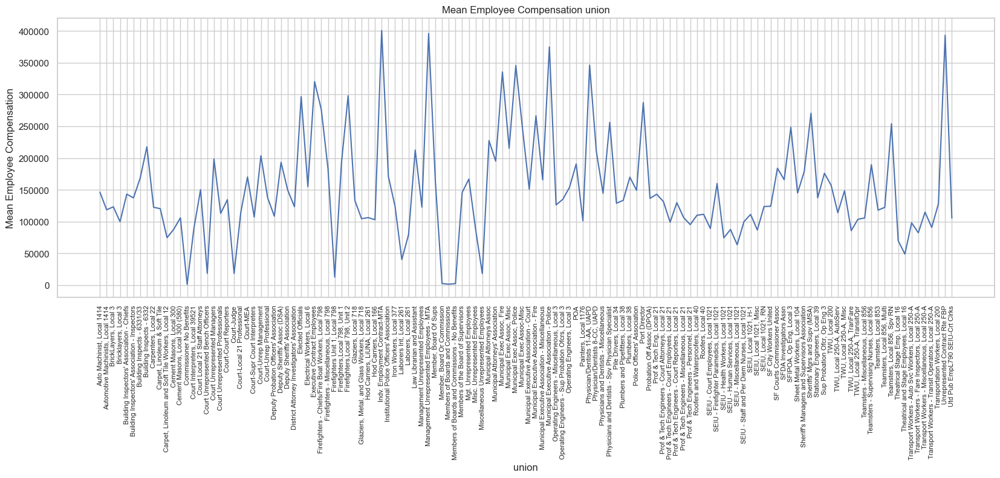

In [386]:
# union to employee compensation 

mean_salary = df2.groupby('Union')['Total Compensation'].mean().reset_index()
plt.figure(figsize=(20, 6))
ax = sns.lineplot(x='Union', y='Total Compensation', data=mean_salary)
plt.xlabel('union')
plt.ylabel('Mean Employee Compensation')
plt.title('Mean Employee Compensation union')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90,fontsize=8);
plt.grid(True)

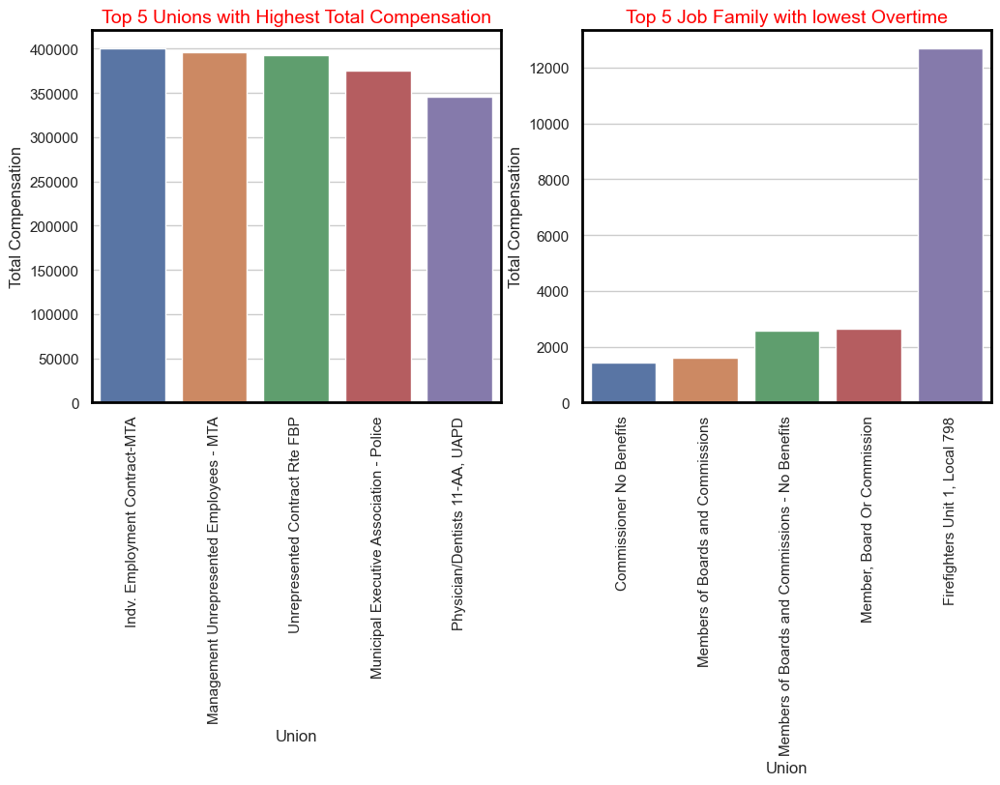

<Figure size 2000x600 with 0 Axes>

<Figure size 2000x600 with 0 Axes>

In [362]:
grouped_data1 = df.groupby('Union')['Total Compensation'].mean().reset_index()
grouped_data1 = grouped_data1.sort_values('Total Compensation',ascending=False)[:5]

fig,ax = plt.subplots(1,2,figsize=(12,5))
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x='Union', y='Total Compensation', data=grouped_data1,ax=ax[0])

ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90);
ax[0].set_title('Top 5 Unions with Highest Total Compensation', fontsize=14,color='red')
for spine in ax[0].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

grouped_data2 = df.groupby('Union')['Total Compensation'].mean().reset_index()
grouped_data2 = grouped_data2.sort_values('Total Compensation')[:5]
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x='Union', y='Total Compensation', data=grouped_data2,ax=ax[1])

ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90);
ax[1].set_title('Top 5 Job Family with lowest Overtime', fontsize=14,color='red')
for spine in ax[1].spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black');

## 9. Assess the impact of retirement contributions and health/dental benefits on total compensation and explore any variations across departments or job families.

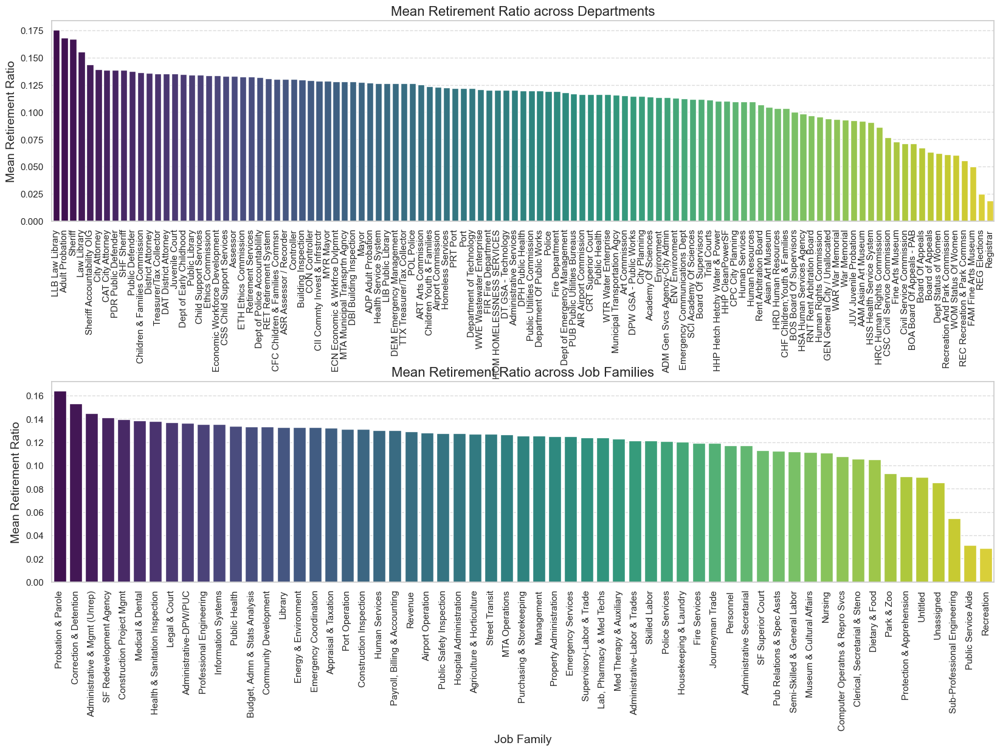

In [381]:
df["Retirement_Ratio"] = df['Retirement'] / df['Total Compensation']
df["Health_Dental_Ratio"] = df["Health and Dental"] / df["Total Compensation"]

department_grouped = df.groupby('Department')["Retirement_Ratio"].mean().reset_index()
department_grouped = department_grouped.sort_values('Retirement_Ratio', ascending=False)

job_family_grouped = df.groupby('Job Family')['Retirement_Ratio'].mean().reset_index()
job_family_grouped = job_family_grouped.sort_values('Retirement_Ratio', ascending=False)

# Create bar plots using matplotlib
fig, ax = plt.subplots(2, 1, figsize=(20, 12))

sns.barplot(x='Department', y='Retirement_Ratio', data=department_grouped, ax=ax[0], palette='viridis')
ax[0].set_xlabel('Department', fontsize=14)
ax[0].set_ylabel('Mean Retirement Ratio', fontsize=14)
ax[0].set_title('Mean Retirement Ratio across Departments', fontsize=16)
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90);
ax[0].grid(axis='y', linestyle='--', alpha=0.7)

sns.barplot(x='Job Family', y='Retirement_Ratio', data=job_family_grouped, ax=ax[1], palette='viridis')
ax[1].set_xlabel('Job Family', fontsize=14)
ax[1].set_ylabel('Mean Retirement Ratio', fontsize=14)
ax[1].set_title('Mean Retirement Ratio across Job Families', fontsize=16)
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90);
ax[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.subplots_adjust(hspace=0.8)

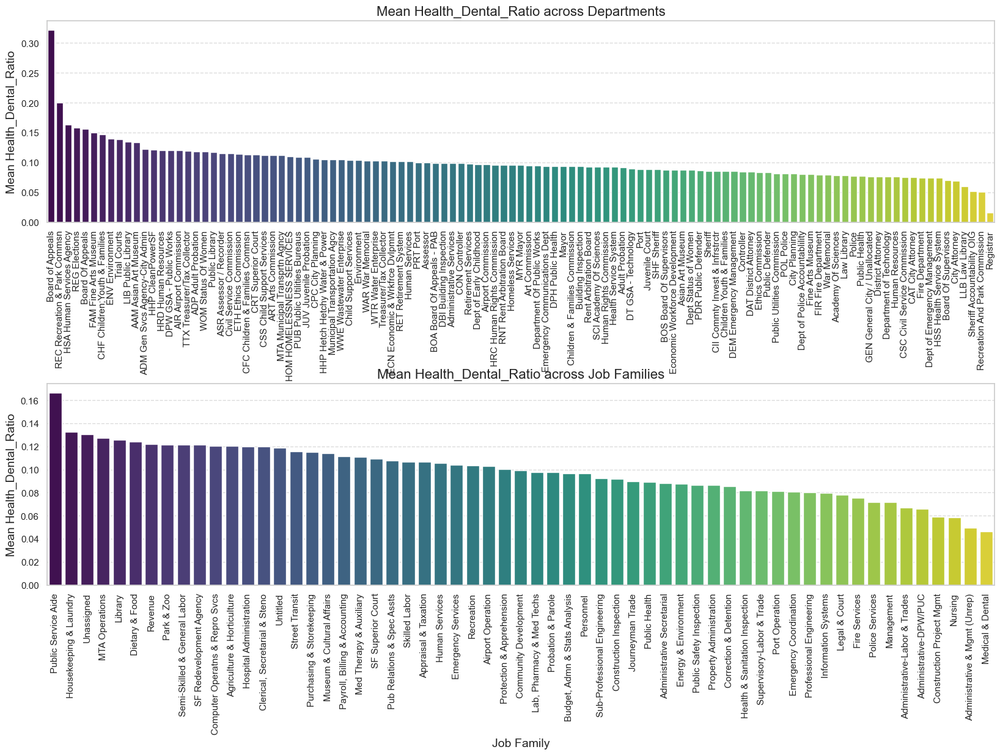

In [382]:
df["Retirement_Ratio"] = df['Retirement'] / df['Total Compensation']
df["Health_Dental_Ratio"] = df["Health and Dental"] / df["Total Compensation"]

department_grouped = df.groupby('Department')["Health_Dental_Ratio"].mean().reset_index()
department_grouped = department_grouped.sort_values('Health_Dental_Ratio', ascending=False)

job_family_grouped = df.groupby('Job Family')['Health_Dental_Ratio'].mean().reset_index()
job_family_grouped = job_family_grouped.sort_values('Health_Dental_Ratio', ascending=False)

# Create bar plots using matplotlib
fig, ax = plt.subplots(2, 1, figsize=(20, 12))

sns.barplot(x='Department', y='Health_Dental_Ratio', data=department_grouped, ax=ax[0], palette='viridis')
ax[0].set_xlabel('Department', fontsize=14)
ax[0].set_ylabel('Mean Health_Dental_Ratio', fontsize=14)
ax[0].set_title('Mean Health_Dental_Ratio across Departments', fontsize=16)
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90);
ax[0].grid(axis='y', linestyle='--', alpha=0.7)

sns.barplot(x='Job Family', y='Health_Dental_Ratio', data=job_family_grouped, ax=ax[1], palette='viridis')
ax[1].set_xlabel('Job Family', fontsize=14)
ax[1].set_ylabel('Mean Health_Dental_Ratio', fontsize=14)
ax[1].set_title('Mean Health_Dental_Ratio across Job Families', fontsize=16)
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90);
ax[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.subplots_adjust(hspace=0.8)

## 10.  Analyze which department's clerk takes maximum salary. Display top 5 departments which pays maximum salary to clerk

In [446]:
# clerk_df = df[df['Job']=='Clerk']

# clerk_df = df[df['Job'].str.contains('clerk', case=False).fillna(False)];clerk_df


In [447]:
contains_temp_rows = df.astype(str).apply(lambda x: x.str.contains('clerk', case=False)).any(axis=1)

# Get the complete rows containing 'contr'
rows_with_temp = df[contains_temp_rows]

department_clerk_max_compensation = rows_with_temp.groupby('Department')['Total Compensation'].max()
top_1_departments = department_clerk_max_compensation.sort_values(ascending=False).head(1)
top_1_departments

Department
Sheriff    336324.77
Name: Total Compensation, dtype: float64

In [448]:
top_5_departments = department_clerk_max_compensation.sort_values(ascending=False).head(5)
top_5_departments

Department
Sheriff                           336324.77
Trial Courts                      253355.18
Recreation And Park Commission    230823.42
Public Health                     205826.38
Human Services                    195643.71
Name: Total Compensation, dtype: float64

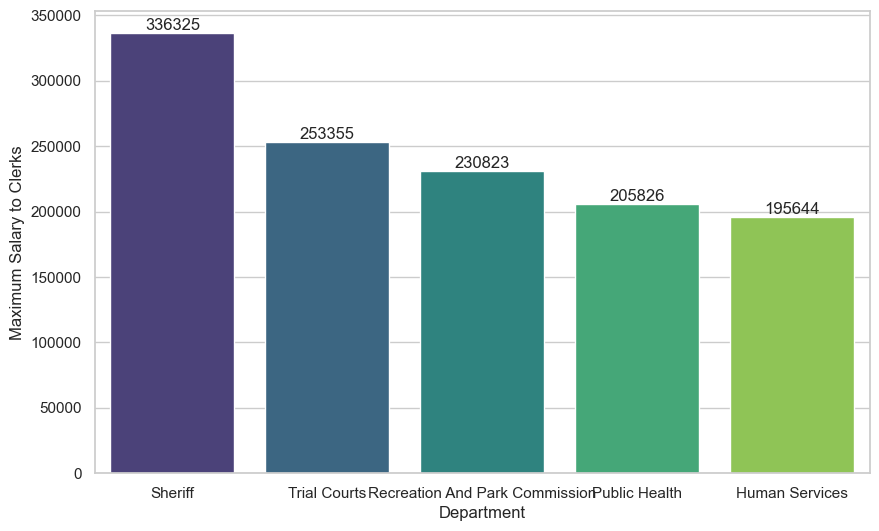

In [449]:
top_5_departments_names = top_5_departments.index
top_5_departments_salaries = top_5_departments.values

top_5_departments_data = pd.DataFrame({'Department': top_5_departments_names, 'Maximum Salary to Clerks': top_5_departments_salaries})

# Step 6: Create the bar plot using Seaborn
fig,ax = plt.subplots(figsize=(10, 6))
sns.barplot(x='Department', y='Maximum Salary to Clerks', data=top_5_departments_data, palette='viridis')
barcount(ax)

In [439]:
# rows_with_temp['Job'].unique()